### Project Description
Every year a lot of companies hire a number of employees. The companies invest time and money in training those employees, not just this but there are training programs within the companies for their existing employees as well. The aim of these programs is to increase the effectiveness of their employees. But where HR Analytics fit in this? and is it just about improving the performance of employees?


#### HR Analytics
Human resource analytics (HR analytics) is an area in the field of analytics that refers to applying analytic processes to the human resource department of an organization in the hope of improving employee performance and therefore getting a better return on investment. HR analytics does not just deal with gathering data on employee efficiency. Instead, it aims to provide insight into each process by gathering data and then using it to make relevant decisions about how to improve these processes.

#### Attrition in HR
Attrition in human resources refers to the gradual loss of employees overtime. In general, relatively high attrition is problematic for companies. HR professionals often assume a leadership role in designing company compensation programs, work culture, and motivation systems that help the organization retain top employees.
How does Attrition affect companies? and how does HR Analytics help in analyzing attrition? We will discuss the first question here and for the second question, we will write the code and try to understand the process step by step.

#### Attrition affecting Companies
A major problem in high employee attrition is its cost to an organization. Job postings, hiring processes, paperwork, and new hire training are some of the common expenses of losing employees and replacing them. Additionally, regular employee turnover prohibits your organization from increasing its collective knowledge base and experience over time. This is especially concerning if your business is customer-facing, as customers often prefer to interact with familiar people. Errors and issues are more likely if you constantly have new workers.

###### Note: You can find the dataset in the link below.

Downlaod Files:

•	https://github.com/FlipRoboTechnologies/ML_-Datasets/blob/main/HR%20Analytics/ibm-hr-analytics-employee-attrition-performance.zip

### importing the neccessary library

In [116]:
# import the library
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [117]:
# read the data
data=pd.read_csv('C:/Users/Arcturus/Downloads/ibm-hr-analytics-employee-attrition-performance/WA_Fn-UseC_-HR-Employee-Attrition.csv')
data

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


In [118]:
print('No of Rows:',data.shape[0])
print('No of Columns:',data.shape[1])

No of Rows: 1470
No of Columns: 35


In [119]:
# Drop the unneccassary column
data.drop(['EmployeeCount','EmployeeNumber'],axis=1,inplace=True)

In [120]:
# Check the columns
data.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'Over18',
       'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [121]:
# check the data types
data.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears            int64
TrainingTimesLastYear        int64
WorkLifeBalance     

here: Out of 33 we have 9 features with Object datatypes and rest are int64 types

In [122]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 33 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EnvironmentSatisfaction   1470 non-null   int64 
 9   Gender                    1470 non-null   object
 10  HourlyRate                1470 non-null   int64 
 11  JobInvolvement            1470 non-null   int64 
 12  JobLevel                  1470 non-null   int64 
 13  JobRole                   1470 non-null   object
 14  JobSatisfaction         

In [123]:
# Check the value counts
for i in data.columns:
    print(data[i].value_counts())
    print('------------------------------------')

Age
35    78
34    77
36    69
31    69
29    68
32    61
30    60
33    58
38    58
40    57
37    50
27    48
28    48
42    46
39    42
45    41
41    40
26    39
44    33
46    33
43    32
50    30
25    26
24    26
49    24
47    24
55    22
51    19
53    19
48    19
54    18
52    18
22    16
56    14
23    14
58    14
21    13
20    11
59    10
19     9
18     8
60     5
57     4
Name: count, dtype: int64
------------------------------------
Attrition
No     1233
Yes     237
Name: count, dtype: int64
------------------------------------
BusinessTravel
Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: count, dtype: int64
------------------------------------
DailyRate
691     6
408     5
530     5
1329    5
1082    5
       ..
650     1
279     1
316     1
314     1
628     1
Name: count, Length: 886, dtype: int64
------------------------------------
Department
Research & Development    961
Sales                     446
Human Resources           

#### here we see : 
    Age,DailyRate,DistanceFromHome,HourlyRate,MonthlyIncome,MonthlyRate,PercentSalaryHike is a continuous feature    and rest are categorical feature.
    We have Target Variable 'Attrition'.and this is categorical column So we can say that this is binary classification problem.
   here we observe Over18 and StandardHours have only fixed values so i think this is not useful for model.

In [124]:
# drop the over18 and StandardHours column
data.drop(['Over18','StandardHours'],axis=1,inplace=True)

#### Check Data intigrity 

In [125]:
# Check the null values
data.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSinceLastPromotion     0
YearsWithCurrManager        0
dtype: int64

<Axes: >

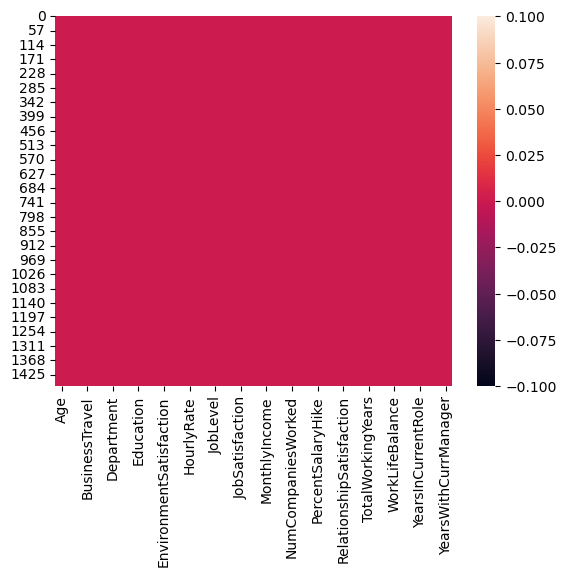

In [126]:
# lets visualization with heatmap for missing values
sns.heatmap(data.isnull())

In [127]:
# Check the duplicate value
data.duplicated().sum()

0

here there is no any duplicate value in dataset

In [128]:
# Check the white spaces for data
data.isin([' ','?','-','null','NA']).sum().any()

False

### Statistical Analysis

In [129]:
# describe the data
data.describe()

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,...,3.153741,2.712245,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,...,0.360824,1.081209,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,...,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,...,3.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,...,3.000000,3.000000,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,...,3.000000,4.000000,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,...,4.000000,4.000000,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


In [130]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1470.0,36.923810,9.135373,18.0,30.0,36.0,43.00,60.0
DailyRate,1470.0,802.485714,403.509100,102.0,465.0,802.0,1157.00,1499.0
DistanceFromHome,1470.0,9.192517,8.106864,1.0,2.0,7.0,14.00,29.0
Education,1470.0,2.912925,1.024165,1.0,2.0,3.0,4.00,5.0
EnvironmentSatisfaction,1470.0,2.721769,1.093082,1.0,2.0,3.0,4.00,4.0
HourlyRate,1470.0,65.891156,20.329428,30.0,48.0,66.0,83.75,100.0
JobInvolvement,1470.0,2.729932,0.711561,1.0,2.0,3.0,3.00,4.0
JobLevel,1470.0,2.063946,1.106940,1.0,1.0,2.0,3.00,5.0
JobSatisfaction,1470.0,2.728571,1.102846,1.0,2.0,3.0,4.00,4.0
MonthlyIncome,1470.0,6502.931293,4707.956783,1009.0,2911.0,4919.0,8379.00,19999.0


##### Comment :
    Here we see all count is same so this is no any missing values.
    1)Minimum Empolyee Age is 18 and Maximum age of employee 60.
    Average distance from home is 9.1 KM. It means that most of employee travel atleast 18 KM in day from home to office.
    On Average performance Rating of employees is 3.163 with min value 3.0. This Means that performance of most of employee is       'Good'.This implies that Attrition of Employee with 'Outstanding' or 5 rating need to investigate.
    50% of Employees has worked atleast 2 companies previously.
    For Monthly Income,Monthly Rate by looking at 50% and max column we can say outliers exist in this feature.
    By looking at Mean and Median we see that some of the features are skew in nature.
    For ordinal features statstical terminology of mean, median, std deviation doesnot make sense.
    StandardHours and EmployeeCount contain same value for all stastical parameter. It means they contain one unique value.

In [131]:
# Check the target value count
data['Attrition'].value_counts()

Attrition
No     1233
Yes     237
Name: count, dtype: int64

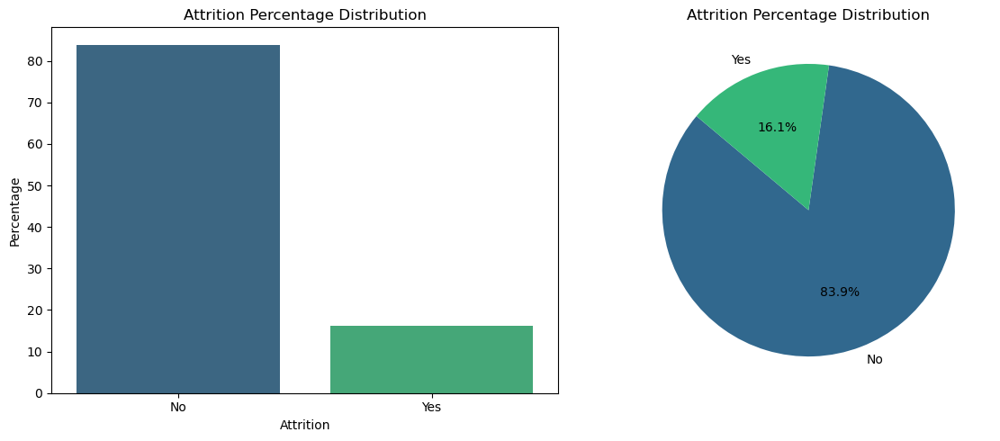

In [132]:
attrition_percentages = data['Attrition'].value_counts(normalize=True) * 100
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

sns.barplot(x=attrition_percentages.index, y=attrition_percentages.values, palette='viridis', ax=ax[0])
ax[0].set_title('Attrition Percentage Distribution')
ax[0].set_xlabel('Attrition')
ax[0].set_ylabel('Percentage')

ax[1].pie(attrition_percentages, labels=attrition_percentages.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('viridis', len(attrition_percentages)))
ax[1].set_title('Attrition Percentage Distribution')

plt.tight_layout()

plt.show()

here 83.9% (1233 employees) Employees did not leave the organization while 16.12% (237 employees) did leave the organization making our dataset to be considered imbalanced since more people stay in the organization than they actually leave.

##### lets some more visualization with feature

In [133]:
aa=pd.Series(data.nunique())
aa

Age                           43
Attrition                      2
BusinessTravel                 3
DailyRate                    886
Department                     3
DistanceFromHome              29
Education                      5
EducationField                 6
EnvironmentSatisfaction        4
Gender                         2
HourlyRate                    71
JobInvolvement                 4
JobLevel                       5
JobRole                        9
JobSatisfaction                4
MaritalStatus                  3
MonthlyIncome               1349
MonthlyRate                 1427
NumCompaniesWorked            10
OverTime                       2
PercentSalaryHike             15
PerformanceRating              2
RelationshipSatisfaction       4
StockOptionLevel               4
TotalWorkingYears             40
TrainingTimesLastYear          7
WorkLifeBalance                4
YearsAtCompany                37
YearsInCurrentRole            19
YearsSinceLastPromotion       16
YearsWithC

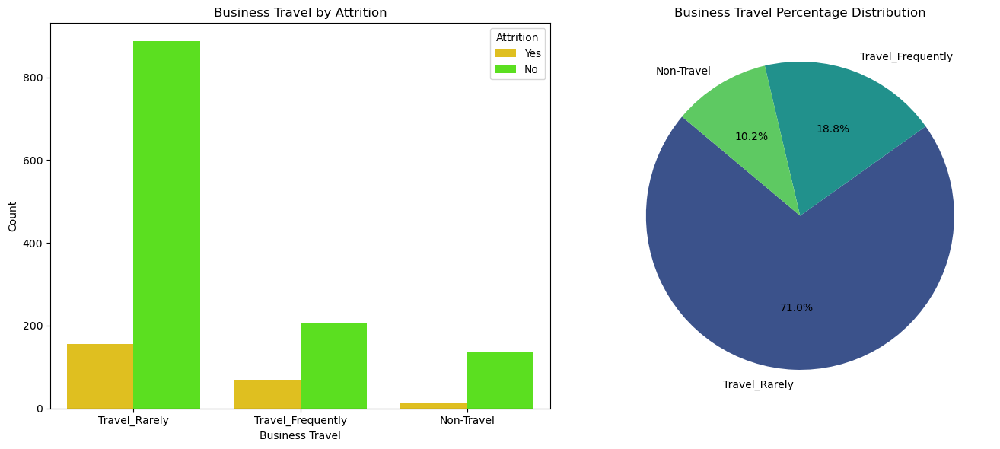

In [134]:
business_travel = data['BusinessTravel'].value_counts()

fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Bar plot
sns.countplot(x='BusinessTravel', hue='Attrition', data=data, ax=ax[0])
ax[0].set_title('Business Travel by Attrition')
ax[0].set_xlabel('Business Travel')
ax[0].set_ylabel('Count')

# Pie chart
ax[1].pie(business_travel, labels=business_travel.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('viridis', len(business_travel)))
ax[1].set_title('Business Travel Percentage Distribution')

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()

here 71% data is travel_Rarely and other aprox 19% Travel_Frequently or 10% Non Travel. In data high attrition in Travel_Frequently.

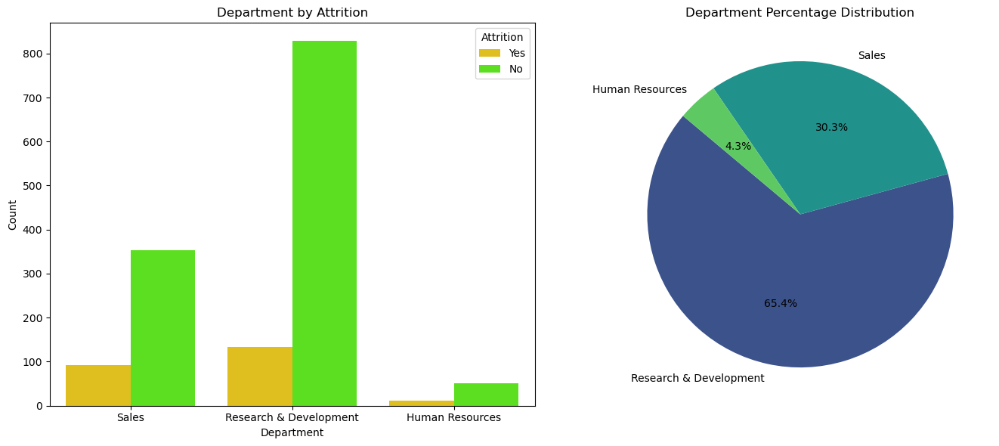

In [135]:
depart = data['Department'].value_counts()

fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Bar plot
sns.countplot(x='Department', hue='Attrition', data=data, ax=ax[0])
ax[0].set_title('Department by Attrition')
ax[0].set_xlabel('Department')
ax[0].set_ylabel('Count')

# Pie chart
ax[1].pie(depart, labels=depart.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('viridis', len(depart)))
ax[1].set_title('Department Percentage Distribution')

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()

here mostly 65% employee in Research & Development Department and 30% in Sales and rest in Sales Department.

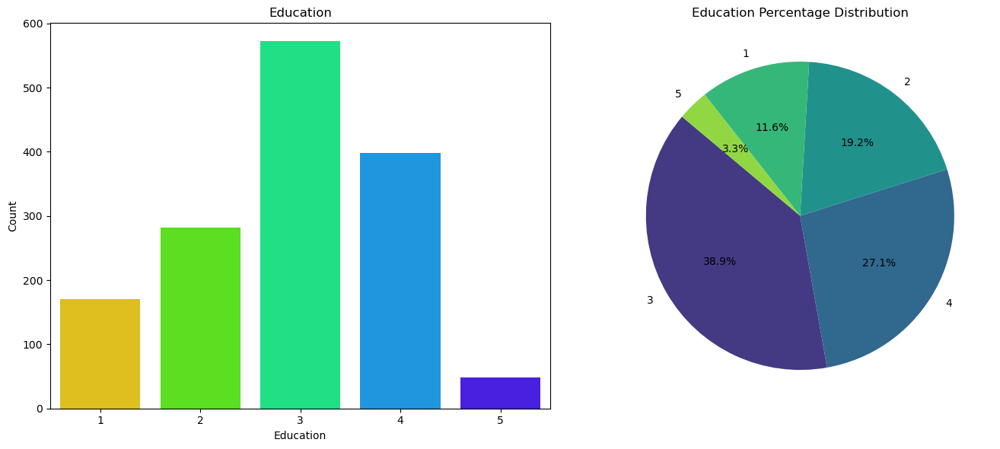

In [136]:
edu = data['Education'].value_counts()

fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Bar plot
sns.countplot(x='Education', data=data, ax=ax[0])
ax[0].set_title('Education')
ax[0].set_xlabel('Education')
ax[0].set_ylabel('Count')

# Pie chart
ax[1].pie(edu, labels=edu.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('viridis', len(edu)))
ax[1].set_title('Education Percentage Distribution')

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()

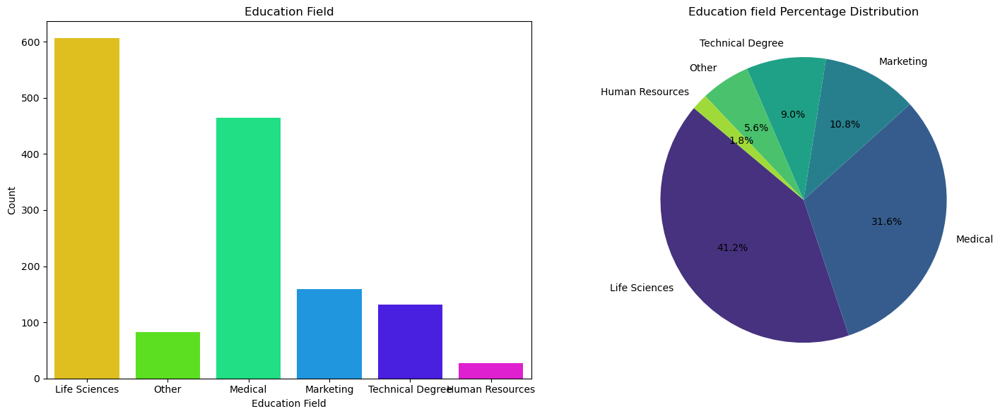

In [137]:
edu = data['EducationField'].value_counts()

fig, ax = plt.subplots(1, 2, figsize=(15,6))

# Bar plot
sns.countplot(x='EducationField', data=data, ax=ax[0])
ax[0].set_title('Education Field')
ax[0].set_xlabel('Education Field')
ax[0].set_ylabel('Count')

# Pie chart
ax[1].pie(edu, labels=edu.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('viridis', len(edu)))
ax[1].set_title('Education field Percentage Distribution')

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()

here mostly 41% employee belong Life Sciences Field and second Medical field(31%) ,other than some Field.

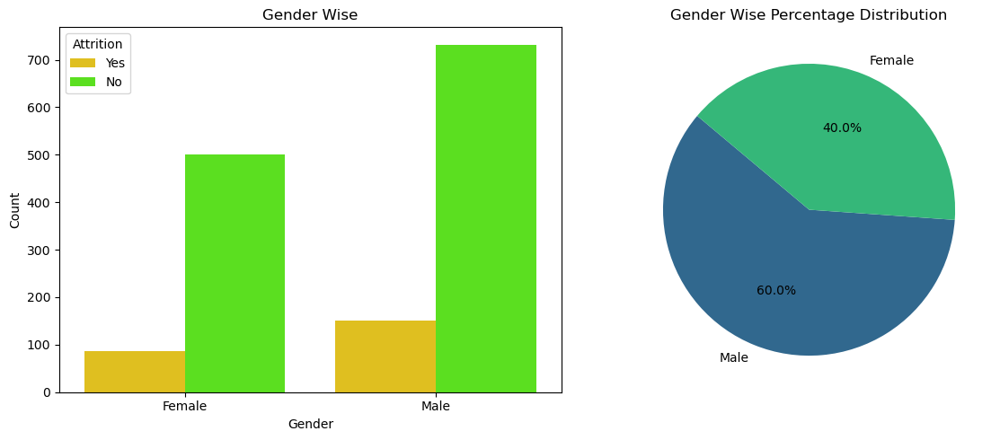

In [138]:
# lets check the gender wise
gender = data['Gender'].value_counts()

fig, ax = plt.subplots(1, 2, figsize=(12,5))

# Bar plot
sns.countplot(x='Gender', data=data, hue='Attrition',ax=ax[0])
ax[0].set_title('Gender Wise')
ax[0].set_xlabel('Gender')
ax[0].set_ylabel('Count')

# Pie chart
ax[1].pie(gender, labels=gender.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('viridis', len(gender)))
ax[1].set_title('Gender Wise Percentage Distribution')

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()

here we clear 60% employee is Male rest are Female. and attrition is high in Male. 

In [139]:
# Lets Check distribution of Educatrion Vs Department
pd.crosstab([data.Education],[data.Department], margins=True).style.background_gradient(cmap='summer_r')

Department,Human Resources,Research & Development,Sales,All
Education,,,,
1,5,115,50,170
2,13,182,87,282
3,27,379,166,572
4,15,255,128,398
5,3,30,15,48
All,63,961,446,1470


In [140]:
# Let check distribution of education Vs education Field
pd.crosstab([data.Education],[data.EducationField,data.Attrition], margins=True).style.background_gradient(cmap='summer_r')

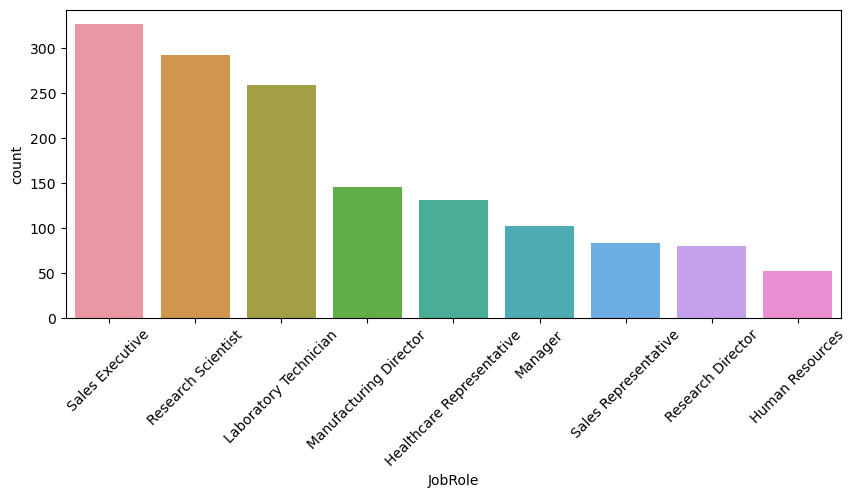

In [141]:
plt.figure(figsize=(10,4))
sns.countplot(x='JobRole',data=data)
plt.xticks(rotation=45)
plt.show()

Here high employee in Sales Executive job role and then Research Scientist and minimun in Human Resources job role.

<Figure size 1100x500 with 0 Axes>

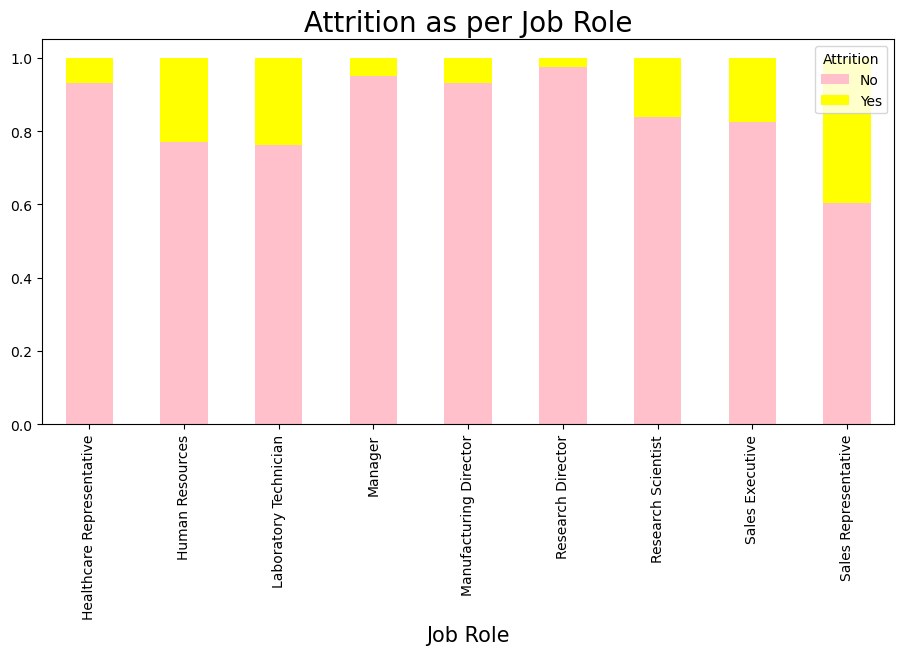

In [142]:
# Lets check job role with target label.
plt.figure(figsize=(11,5))
datas=pd.crosstab(data['JobRole'], data['Attrition'])
datas.div(datas.sum(1).astype(float), axis=0).plot(kind='bar', stacked=True, 
                    color=['pink', 'yellow'],figsize=(11,5))
plt.title('Attrition as per Job Role', fontsize=20)
plt.xlabel('Job Role',fontsize=15)
plt.show()

Bar plot showing % attrition across each job role, high attrition in max yellow color in Sales Representative ,Laboratory and Human Resource.

<Axes: xlabel='Age', ylabel='count'>

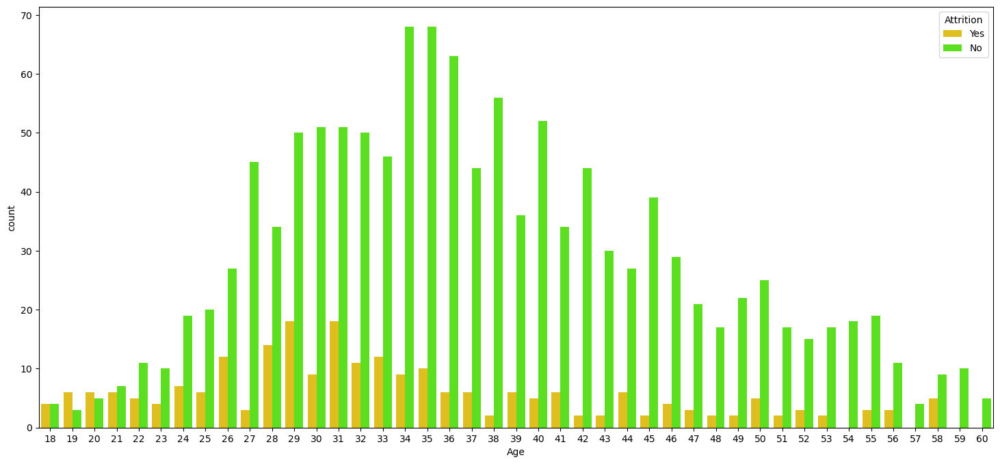

In [143]:
# Lets check Age Vs Attrition
sns.set_palette('hsv')
plt.subplots(figsize=(18,8))
sns.countplot(x='Age', hue='Attrition', data=data)

##### Comment:
    The minimum attrition rate between the Age years of 34 and 35.
    The maximum attrition rate between the Age years of 29 and 31.

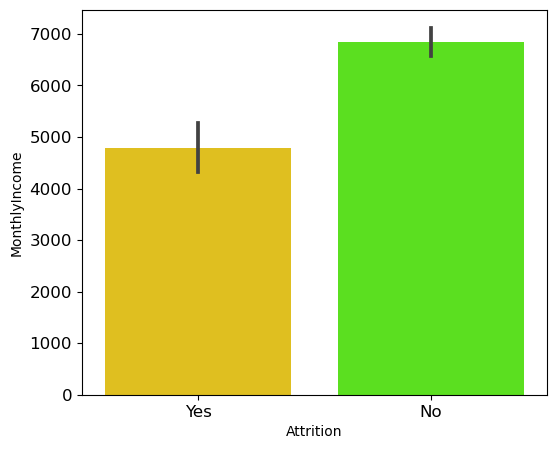

In [144]:
# Lets check Atrrition Vs Monthly income
plt.figure(figsize=(6,5))
sns.barplot(x='Attrition',y='MonthlyIncome',data=data)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

here when the monthly income reaches aprox 7000 then atrrition rate minimum and reaches aprox 5000 then max attrition rate.

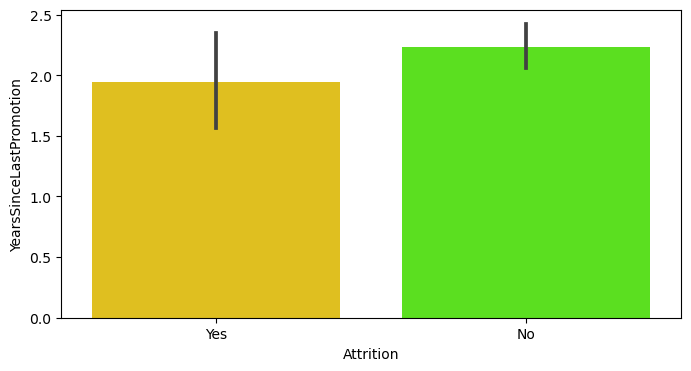

In [145]:
plt.figure(figsize=(8,4))
sns.barplot(x='Attrition',y='YearsSinceLastPromotion',data=data)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

The Attrition rate is high when the employee did not got promoted since 1.8 years.

<Figure size 2500x3000 with 0 Axes>

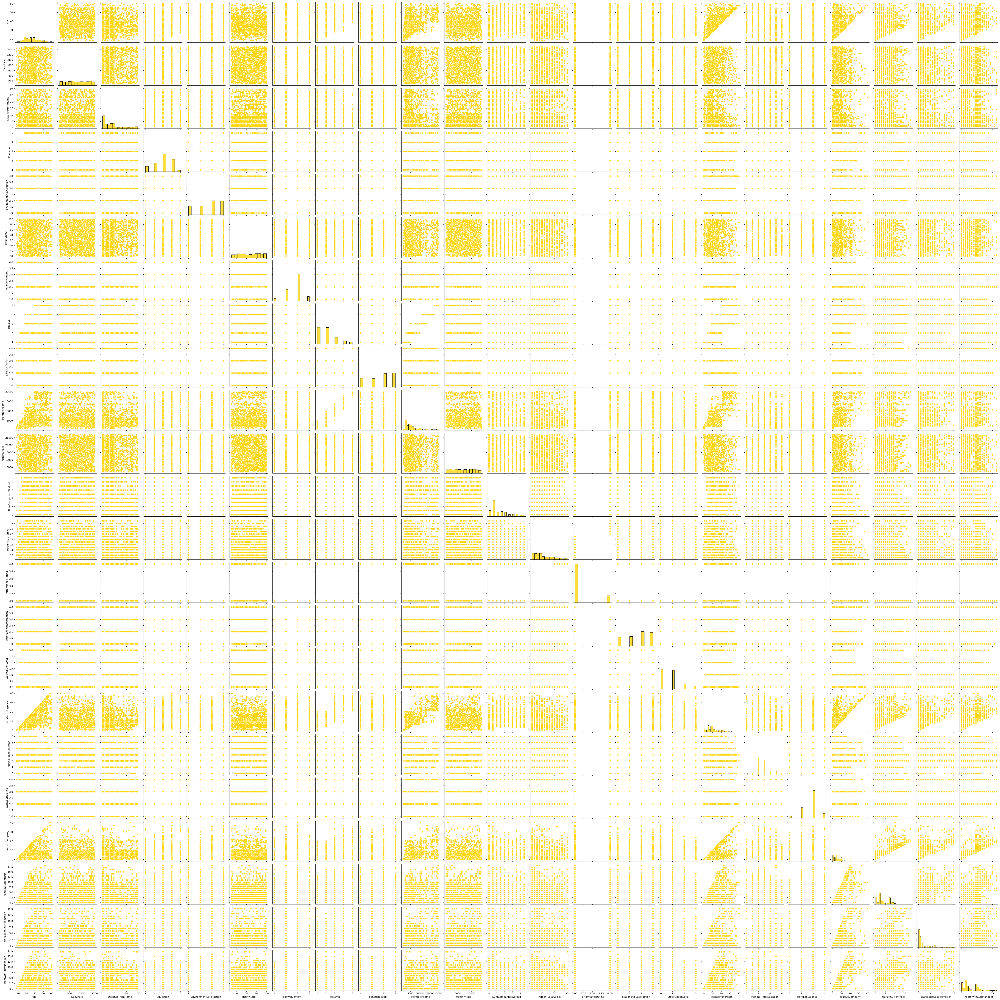

In [146]:
# Visualization with pairplot
plt.figure(figsize=(25,30))
sns.pairplot(data,palette='Dark2')
plt.show()

### Convert object column in numeric column

In [147]:
# Label Encoding for object data type
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for col in data.columns:
    if data[col].dtype=='object':
        data[col] = le.fit_transform(data[col])
data.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,2,1102,2,1,2,1,2,0,...,3,1,0,8,0,1,6,4,0,5
1,49,0,1,279,1,8,1,1,3,1,...,4,4,1,10,3,3,10,7,1,7
2,37,1,2,1373,1,2,2,4,4,1,...,3,2,0,7,3,3,0,0,0,0
3,33,0,1,1392,1,3,4,1,4,0,...,3,3,0,8,3,3,8,7,3,0
4,27,0,2,591,1,2,1,3,1,1,...,3,4,1,6,3,3,2,2,2,2


# Check the Outliers

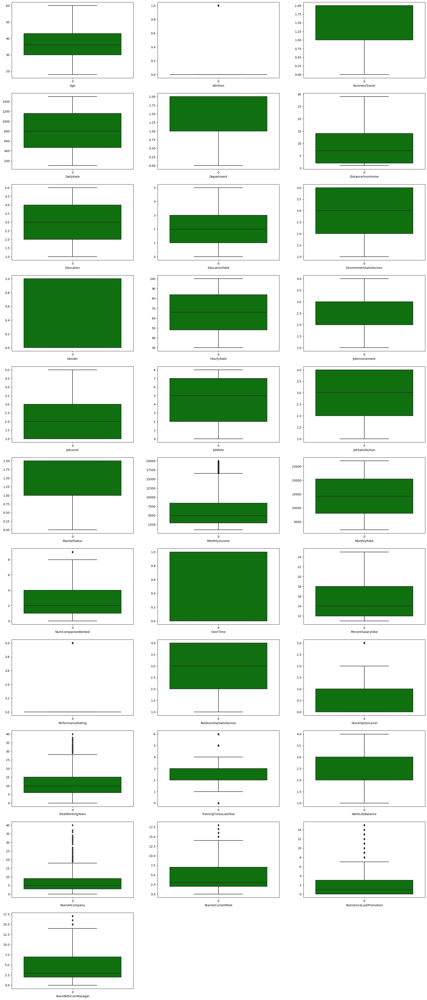

In [148]:
# check the outliers by plotting boxplot
plt.figure(figsize=(25,60))
column=1
for col in data:
    if column<=33:
        plt.subplot(11,3,column)
        sns.boxplot(data[col],color='g')
        plt.xlabel(col)
    column +=1
plt.show()

here MonthlyIncome,NumCompaniesWorked,PerformanceRating,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,
YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager and Attrition. but Attriton is a target label.

In [149]:
df=data #assigning data in new variable

In [150]:
# Remove the outliers
def replace_outliers_num(column):
    q1 = column.quantile(0.25)
    q3 = column.quantile(0.75)
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr
    
    median = np.median(column)
    column = column.apply(lambda x: median if x > upper or x < lower else x)
    return column

def replace_outliers_cat(column):
    q1 = column.quantile(0.25)
    q3 = column.quantile(0.75)
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr
    
    mode = column.mode().iloc[0]
    column = column.apply(lambda x: mode if x > upper or x < lower else x)
    return column

# Assuming out_df is your DataFrame and you want to apply this to specific columns
columns_continuous = ['NumCompaniesWorked','StockOptionLevel','TrainingTimesLastYear','YearsInCurrentRole','YearsWithCurrManager']
columns_category=['MonthlyIncome','TotalWorkingYears','YearsAtCompany','YearsSinceLastPromotion']
for col in columns_continuous:
    df[col] = replace_outliers_num(df[col])
    
for col in columns_category:
    df[col]= replace_outliers_cat(df[col])

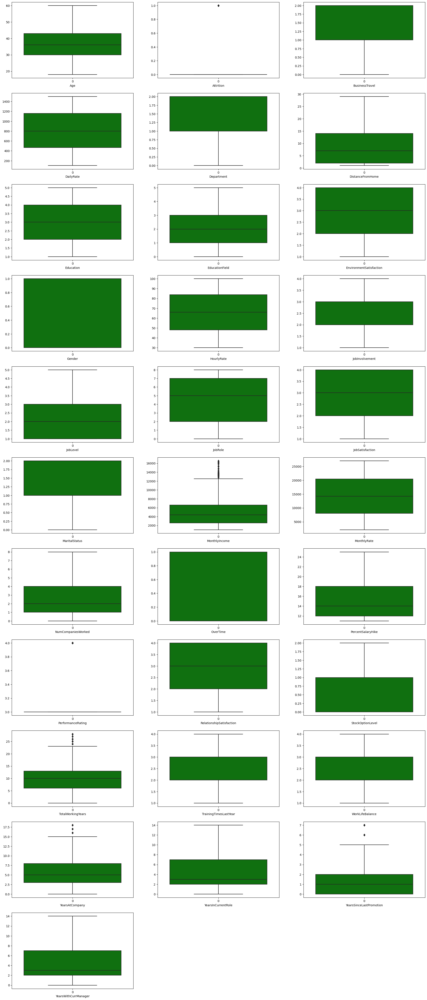

In [151]:
# Checked after remove oultiers by boxplot
plt.figure(figsize=(25,60))
column=1
for col in df:
    if column<=33:
        plt.subplot(11,3,column)
        sns.boxplot(df[col],color='g')
        plt.xlabel(col)
    column +=1
plt.show()

# Feature Selection

#### 1 Check Skewness

In [152]:
# Checked the skewness
df.skew()

Age                         0.413286
Attrition                   1.844366
BusinessTravel             -1.439006
DailyRate                  -0.003519
Department                  0.172231
DistanceFromHome            0.958118
Education                  -0.289681
EducationField              0.550371
EnvironmentSatisfaction    -0.321654
Gender                     -0.408665
HourlyRate                 -0.032311
JobInvolvement             -0.498419
JobLevel                    1.025401
JobRole                    -0.357270
JobSatisfaction            -0.329672
MaritalStatus              -0.152175
MonthlyIncome               1.278199
MonthlyRate                 0.018578
NumCompaniesWorked          1.018827
OverTime                    0.964489
PercentSalaryHike           0.821128
PerformanceRating           1.921883
RelationshipSatisfaction   -0.302828
StockOptionLevel            0.455412
TotalWorkingYears           0.806549
TrainingTimesLastYear      -0.111186
WorkLifeBalance            -0.552480
Y

    The skewness range is (-0.5 to 0.5) correct. but here we see BusinessTravel, DistanceFromHome, EducationField ,JobLevel,
    MonthlyIncome , NumCompaniesWorked ,OverTime ,PercentSalaryHike , TotalWorkingYears , WorkLifeBalance , YearsAtCompany , 
    YearsInCurrentRole ,YearsSinceLastPromotion , YearsWithCurrManager have + or  - skewness.

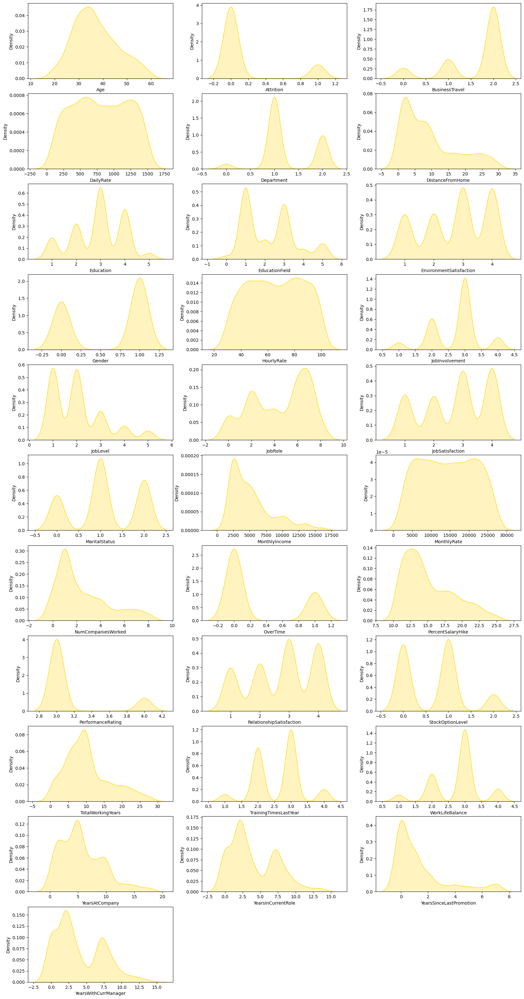

In [154]:
# Check the Skewness
plt.figure(figsize=(20,40))
column=1
for col in df:
    if column<33:
        plt.subplot(11,3,column)
        sns.kdeplot(df[col],shade = True)
        plt.xlabel(col)
    column +=1
plt.show()

In [155]:
# Remove the skewness for both + or -
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer(method='yeo-johnson')
def rm_skew(col):
    df[col] = pt.fit_transform(df[[col]])
skew_column=['BusinessTravel','DistanceFromHome','EducationField','JobLevel','MonthlyIncome','NumCompaniesWorked','OverTime',
            'PercentSalaryHike','TotalWorkingYears','WorkLifeBalance','YearsAtCompany','YearsInCurrentRole','YearsSinceLastPromotion',
            'YearsWithCurrManager']
for col in skew_column:
    rm_skew(col)

#### 2 . Correlation

In [156]:
# Check the correlation
df.corr()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,-0.159205,0.028052,0.010661,-0.031882,-0.021588,0.208034,-0.035908,0.010146,-0.036311,...,0.001904,0.053535,0.051831,0.576855,0.030620,-0.021629,0.148150,0.170532,0.054479,0.171642
Attrition,-0.159205,1.000000,-0.035392,-0.056652,0.063991,0.078213,-0.031373,0.016422,-0.103369,0.029453,...,0.002889,-0.045872,-0.184772,-0.212418,0.003276,-0.053285,-0.194614,-0.182116,-0.037728,-0.176619
BusinessTravel,0.028052,-0.035392,1.000000,0.000253,-0.008308,-0.004196,0.003178,0.033321,0.007333,-0.020448,...,-0.026814,-0.038483,-0.002828,0.024803,0.012983,-0.013531,-0.017068,-0.030881,-0.006513,-0.034072
DailyRate,0.010661,-0.056652,0.000253,1.000000,0.007109,-0.003130,-0.016806,0.037833,0.018355,-0.011716,...,0.000473,0.007846,0.022917,0.028321,-0.036257,-0.039820,0.007217,0.006943,-0.019264,0.006364
Department,-0.031882,0.063991,-0.008308,0.007109,1.000000,0.028139,0.007996,0.075224,-0.019395,-0.041583,...,-0.024604,-0.022414,0.004383,0.002956,0.028184,0.022753,0.039370,0.052041,-0.001349,0.027871
DistanceFromHome,-0.021588,0.078213,-0.004196,-0.003130,0.028139,1.000000,0.019562,0.016314,-0.009526,0.007120,...,0.011620,0.009457,0.046230,0.004435,-0.021198,-0.026194,0.013951,0.018770,0.006908,0.000230
Education,0.208034,-0.031373,0.003178,-0.016806,0.007996,0.019562,1.000000,-0.040852,-0.027128,-0.016547,...,-0.024539,-0.009118,0.016974,0.141743,0.004428,0.011056,0.069866,0.054858,0.000037,0.047576
EducationField,-0.035908,0.016422,0.033321,0.037833,0.075224,0.016314,-0.040852,1.000000,0.039040,-0.008876,...,-0.002094,-0.005903,-0.011336,-0.003321,0.035474,0.042226,0.003053,0.005687,0.016072,0.014628
EnvironmentSatisfaction,0.010146,-0.103369,0.007333,0.018355,-0.019395,-0.009526,-0.027128,0.039040,1.000000,0.000508,...,-0.029548,0.007665,0.016455,-0.034826,0.020693,0.026320,0.016320,0.033233,0.023315,-0.001785
Gender,-0.036311,0.029453,-0.020448,-0.011716,-0.041583,0.007120,-0.016547,-0.008876,0.000508,1.000000,...,-0.013859,0.022868,0.016456,-0.041091,-0.016484,0.000237,-0.047174,-0.031394,-0.017931,-0.029438


<Axes: >

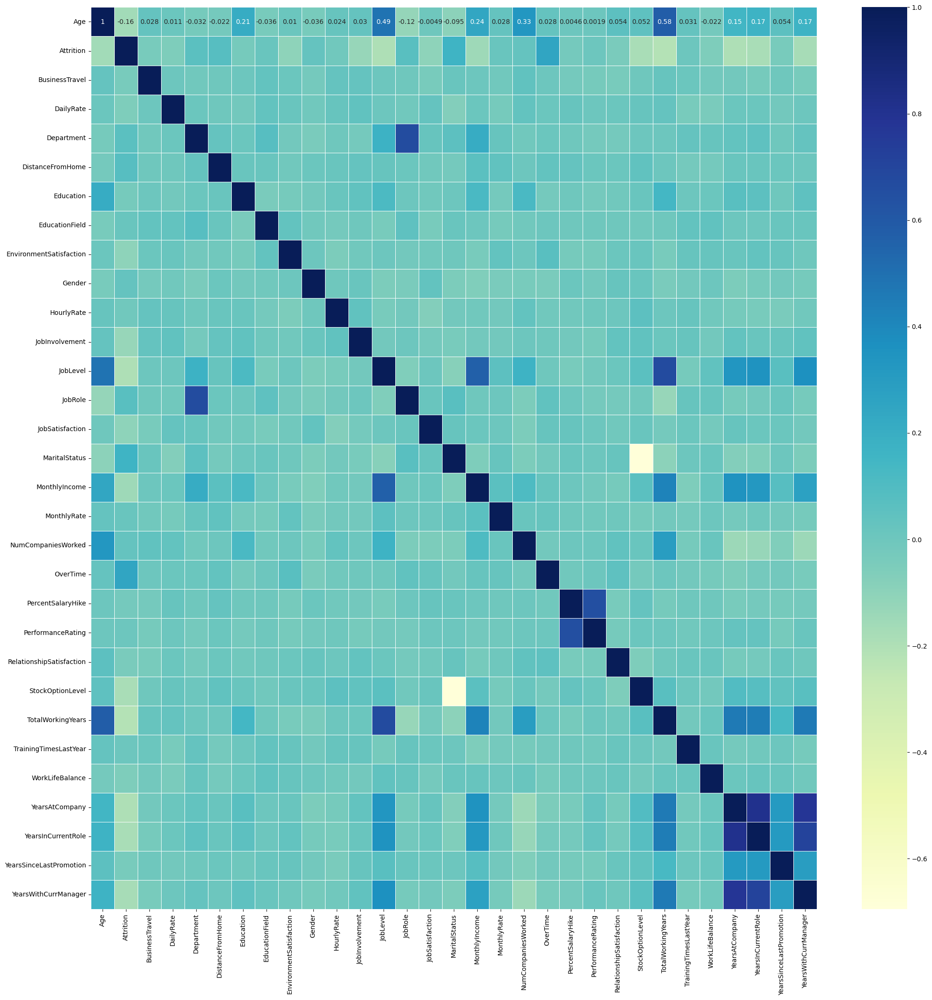

In [158]:
# Lets visualize the correlation with heatmap
plt.subplots(figsize=(25,25))
sns.heatmap(df.corr(),cmap='YlGnBu',annot=True, linewidth=.5)

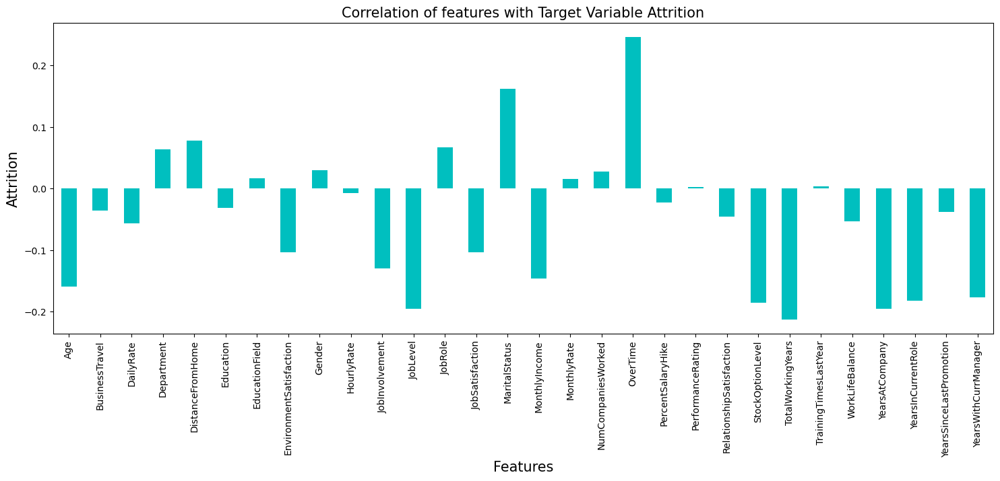

In [159]:
plt.figure(figsize = (18,6))
df.corr()['Attrition'].drop(['Attrition']).plot(kind='bar',color = 'c')
plt.xlabel('Features',fontsize=15)
plt.ylabel('Attrition',fontsize=15)
plt.title('Correlation of features with Target Variable Attrition',fontsize = 15)
plt.show()

#### Comment:
    Age, JobLevel, MonthlyIncome,YearsWithCurrManager is highly positively correlated with TotalWorkingYears.
    JobLevel is highly positively correlated with the MonthlyIncome.

In [160]:
# Show the correlation with target variable
show_cor=df.corr()
show_cor['Attrition'].sort_values(ascending=False)

Attrition                   1.000000
OverTime                    0.246118
MaritalStatus               0.162070
DistanceFromHome            0.078213
JobRole                     0.067151
Department                  0.063991
Gender                      0.029453
NumCompaniesWorked          0.027605
EducationField              0.016422
MonthlyRate                 0.015170
TrainingTimesLastYear       0.003276
PerformanceRating           0.002889
HourlyRate                 -0.006846
PercentSalaryHike          -0.022524
Education                  -0.031373
BusinessTravel             -0.035392
YearsSinceLastPromotion    -0.037728
RelationshipSatisfaction   -0.045872
WorkLifeBalance            -0.053285
DailyRate                  -0.056652
EnvironmentSatisfaction    -0.103369
JobSatisfaction            -0.103481
JobInvolvement             -0.130016
MonthlyIncome              -0.145974
Age                        -0.159205
YearsWithCurrManager       -0.176619
YearsInCurrentRole         -0.182116
S

### Separate feature and Label

In [161]:
X=df.drop(['Attrition'],axis=1)
Y=df['Attrition']

In [162]:
X.shape

(1470, 30)

In [163]:
Y.shape

(1470,)

In [164]:
Y.value_counts()

Attrition
0    1233
1     237
Name: count, dtype: int64

here we see this is a imbalanced problem

#### Remove Imbalanced Using Smote

In [165]:
from imblearn.over_sampling import SMOTE
# using oversampling method
over = SMOTE()
X, Y = over.fit_resample(X, Y)

In [166]:
X.shape

(2466, 30)

In [167]:
Y.shape

(2466,)

In [168]:
Y.value_counts()

Attrition
1    1233
0    1233
Name: count, dtype: int64

#### 3 .Using Standard Scalar

In [169]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
X=pd.DataFrame(sc.fit_transform(X),columns=X.columns)
X

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.643272,0.742030,0.834631,1.584730,-1.698629,-0.770466,-1.032539,-0.433947,-1.038873,1.498148,...,-0.335133,-1.453536,-0.916520,-0.005601,0.587028,-2.171570,0.467905,0.425637,-1.035264,0.723350
1,1.549928,-1.418588,-1.272016,-0.345119,0.168448,-1.795260,-1.032539,0.494971,0.962581,-0.261868,...,2.983893,1.399544,0.712221,0.335707,0.587028,0.342661,1.335830,1.185973,0.457073,1.183804
2,0.189944,0.742030,1.528314,-0.345119,-1.201241,-0.770466,1.311392,1.423890,0.962581,1.391480,...,-0.335133,-0.502509,-0.916520,-0.192722,0.587028,0.342661,-2.041423,-1.508830,-1.035264,-1.450031
3,-0.263384,-1.418588,1.576948,-0.345119,-0.845697,1.279123,-1.032539,1.423890,-1.038873,-0.528537,...,-0.335133,0.448518,-0.916520,-0.005601,0.587028,0.342661,0.933647,1.185973,1.337046,-1.450031
4,-0.943376,0.742030,-0.473385,-0.345119,-1.201241,-1.795260,0.727318,-1.362866,0.962581,-1.381877,...,-0.335133,1.399544,0.712221,-0.393781,0.587028,0.342661,-0.834068,-0.289916,1.027094,-0.246751
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2461,-0.376716,0.742030,1.246745,-0.345119,1.126687,0.254329,-1.032539,-1.362866,0.962581,-0.048532,...,-0.335133,0.448518,-0.916520,-1.302952,0.158834,-0.578762,-0.686181,-0.813354,-1.035264,-0.558726
2462,-0.830044,0.742030,1.620463,-0.345119,0.855683,-1.795260,0.885133,0.494971,-1.038873,0.271470,...,-0.335133,-1.453536,-0.916520,-1.291698,0.096508,-1.095979,-0.935323,-0.991075,-0.554943,-0.940368
2463,-0.150052,-1.072668,-1.635496,-0.345119,-0.478589,0.254329,0.445560,-0.433947,-1.038873,-0.581870,...,-0.335133,-1.453536,-0.916520,-0.662145,0.343028,0.342661,-0.332387,-0.227519,0.218146,0.014198
2464,-0.376716,0.742030,0.798794,-0.345119,0.018076,0.254329,1.075229,-1.362866,-1.038873,-0.581870,...,2.983893,-1.453536,-0.916520,0.281699,-0.936995,1.547716,0.440178,0.673373,-0.197882,0.689034


#### 4 Using Variance Inflation Factor

In [170]:
# to handle the multicoilarity means two or more ondependent columns highly correlated to each other
from statsmodels.stats.outliers_influence import variance_inflation_factor
multicoil=pd.DataFrame()
multicoil["VIF values"]=[variance_inflation_factor(X.values,col) for col in range(len(X.columns))]
multicoil["Features"]=X.columns
multicoil

,VIF values,Features
0,1.805430,Age
1,1.021641,BusinessTravel
2,1.040257,DailyRate
3,1.993144,Department
4,1.037507,DistanceFromHome
5,1.096427,Education
6,1.049953,EducationField
7,1.074704,EnvironmentSatisfaction
8,1.048013,Gender
9,1.041488,HourlyRate


#### 5. Using PCA

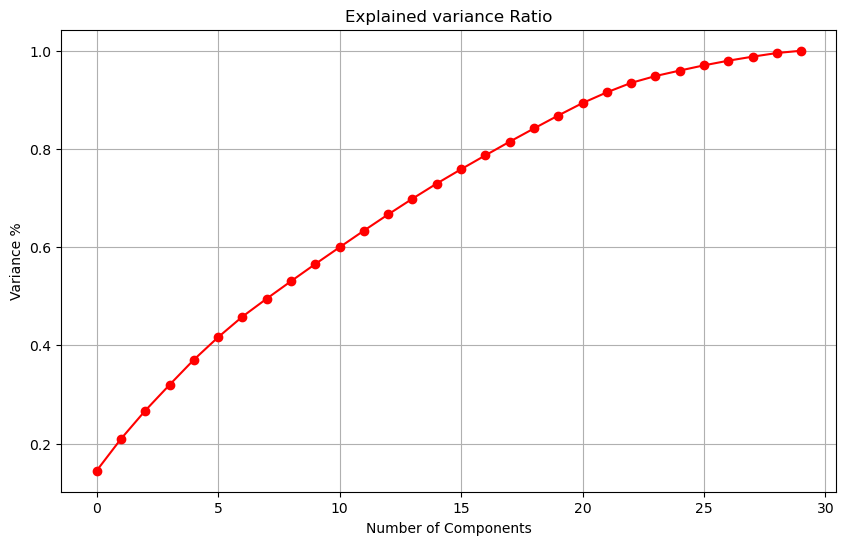

In [172]:
from sklearn.decomposition import PCA
pca = PCA()

x = pca.fit_transform(X)
plt.figure(figsize=(10,6))
plt.plot(np.cumsum(pca.explained_variance_ratio_), 'ro-')
plt.xlabel('Number of Components')
plt.ylabel('Variance %')
plt.title('Explained variance Ratio')
plt.grid()

##### AS per the graph, we can see that 25 principal components attribute almost 95%  of variation in the data. We shall pick the first 25 components for our prediction

In [173]:
pca_x = PCA(n_components=25)
rmpca_x = pca_x.fit_transform(X)
X=pd.DataFrame(rmpca_x,columns=np.arange(25))

# Model Building

In [176]:
# finding the best random state
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.ensemble import ExtraTreesClassifier,GradientBoostingClassifier,AdaBoostClassifier,BaggingClassifier,RandomForestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report,confusion_matrix,roc_curve
Accuracy_max=0
Random_state_max=0
for random in range(1,100):
    x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=0.25,random_state=random)
    RFC=RandomForestClassifier()
    RFC.fit(x_train,y_train)
    pred=RFC.predict(x_test)
    accuracy=accuracy_score(y_test,pred)
    if accuracy>Accuracy_max:
        Accuracy_max=accuracy
        Random_state_max=random
print(f"Best accuracy is: {Accuracy_max} at random_state: {Random_state_max}")

Best accuracy is: 0.9157212317666127 at random_state: 51


In [177]:
# Find the random state with LogisticRegression (Binary Classification)
Accuracy_max=0
Random_state_max=0
for random in range(1,100):
    x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=0.25,random_state=random)
    lr=LogisticRegression()
    lr.fit(x_train,y_train)
    pred=lr.predict(x_test)
    accuracy=accuracy_score(y_test,pred)
    if accuracy>Accuracy_max:
        Accuracy_max=accuracy
        Random_state_max=random
print(f"Best accuracy is: {Accuracy_max} at random_state: {Random_state_max}")

Best accuracy is: 0.8606158833063209 at random_state: 9


So here we observe that Random forest Classifier have best accuracy with 51 random state.

In [179]:
x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=0.25,random_state=51)

##### Check the other Classification Model

In [181]:
all_model=[RandomForestClassifier,GradientBoostingClassifier,AdaBoostClassifier,BaggingClassifier,DecisionTreeClassifier,KNN,SVC]
for model in all_model:
    obj=model()
    obj.fit(x_train,y_train)
    predict=obj.predict(x_test)
    pred_train= obj.predict(x_train)
    print(f"-------------Accuracy with {str (model)}-----------------")
    print("Accuracy :",accuracy_score(y_test,predict))
    print("Acuracy on trained data :",accuracy_score(y_train,pred_train)*100)
    print(confusion_matrix(y_test,predict))
    print(classification_report(y_test,predict))
    
    print(f"*******Check the validation Score***********")
    score=cross_val_score(obj,X,Y,cv=10)
    print(score)
    print('val-score : ',score.mean())
    print(f"Difference between Accuracy score and cross validation score is : {accuracy_score(y_test,predict)-score.mean()}")
    print()

-------------Accuracy with <class 'sklearn.ensemble._forest.RandomForestClassifier'>-----------------
Accuracy : 0.9092382495948136
Acuracy on trained data : 100.0
[[282  22]
 [ 34 279]]
              precision    recall  f1-score   support

           0       0.89      0.93      0.91       304
           1       0.93      0.89      0.91       313

    accuracy                           0.91       617
   macro avg       0.91      0.91      0.91       617
weighted avg       0.91      0.91      0.91       617

*******Check the validation Score***********
[0.78137652 0.73279352 0.92307692 0.93117409 0.91902834 0.92307692
 0.93495935 0.92276423 0.91056911 0.93089431]
val-score :  0.8909713307659392
Difference between Accuracy score and cross validation score is : 0.018266918828874434

-------------Accuracy with <class 'sklearn.ensemble._gb.GradientBoostingClassifier'>-----------------
Accuracy : 0.873581847649919
Acuracy on trained data : 94.21308815575988
[[260  44]
 [ 34 279]]
          

###### On basis of maximum score in cross validation of Support Vector Classifier. we will apply Hyperparameter tuning on SVC.

# HyperPara Tuning with GridSearchCV

In [182]:
from sklearn.model_selection import GridSearchCV

In [186]:
parameter = {
            'C' : [0.5,1.0,2.0],
            'kernel' : ['linear', 'poly', 'rbf'],
            'gamma':['scale','auto'],
            'max_iter':[1,-1,2],
            'random_state':range(1,80)
             }

In [187]:
gcv = GridSearchCV(SVC(),parameter,verbose=5,cv=5)
gcv.fit(x_train,y_train)

Fitting 5 folds for each of 4266 candidates, totalling 21330 fits
[CV 1/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=1;, score=0.511 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=1;, score=0.486 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=1;, score=0.522 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=1;, score=0.503 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=1;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=2;, score=0.511 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=2;, score=0.486 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=2;, score=0.522 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_sta

[CV 4/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=23;, score=0.503 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=23;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=24;, score=0.511 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=24;, score=0.486 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=24;, score=0.522 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=24;, score=0.503 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=24;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=25;, score=0.511 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=25;, score=0.486 total time=   0.0s
[CV 3/5] END C=0.5,

[CV 5/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=38;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=39;, score=0.511 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=39;, score=0.486 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=39;, score=0.522 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=39;, score=0.503 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=39;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=40;, score=0.511 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=40;, score=0.486 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=40;, score=0.522 total time=   0.0s
[CV 4/5] END C=0.5,

[CV 4/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=55;, score=0.503 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=55;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=56;, score=0.511 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=56;, score=0.486 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=56;, score=0.522 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=56;, score=0.503 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=56;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=57;, score=0.511 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=57;, score=0.486 total time=   0.0s
[CV 3/5] END C=0.5,

[CV 2/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=73;, score=0.486 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=73;, score=0.522 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=73;, score=0.503 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=73;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=74;, score=0.511 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=74;, score=0.486 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=74;, score=0.522 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=74;, score=0.503 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=linear, max_iter=1, random_state=74;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5,

[CV 4/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=9;, score=0.824 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=9;, score=0.813 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=10;, score=0.822 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=10;, score=0.838 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=10;, score=0.849 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=10;, score=0.824 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=10;, score=0.813 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=11;, score=0.822 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=11;, score=0.838 total time=   0.0s
[CV 3/5] END

[CV 1/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=25;, score=0.822 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=25;, score=0.838 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=25;, score=0.849 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=25;, score=0.824 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=25;, score=0.813 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=26;, score=0.822 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=26;, score=0.838 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=26;, score=0.849 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=26;, score=0.824 total time=   0.0s
[CV 5/5] E

[CV 1/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=40;, score=0.822 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=40;, score=0.838 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=40;, score=0.849 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=40;, score=0.824 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=40;, score=0.813 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=41;, score=0.822 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=41;, score=0.838 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=41;, score=0.849 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=41;, score=0.824 total time=   0.0s
[CV 5/5] E

[CV 3/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=55;, score=0.849 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=55;, score=0.824 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=55;, score=0.813 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=56;, score=0.822 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=56;, score=0.838 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=56;, score=0.849 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=56;, score=0.824 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=56;, score=0.813 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=57;, score=0.822 total time=   0.0s
[CV 2/5] E

[CV 5/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=70;, score=0.813 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=71;, score=0.822 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=71;, score=0.838 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=71;, score=0.849 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=71;, score=0.824 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=71;, score=0.813 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=72;, score=0.822 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=72;, score=0.838 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=linear, max_iter=-1, random_state=72;, score=0.849 total time=   0.0s
[CV 4/5] E

[CV 1/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=8;, score=0.589 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=8;, score=0.611 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=8;, score=0.386 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=8;, score=0.589 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=8;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=9;, score=0.589 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=9;, score=0.611 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=9;, score=0.386 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=9;, score=0.589 total time=   0.0s
[CV 5/5] END C=0.5, gamma=sc

[CV 4/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=28;, score=0.589 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=28;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=29;, score=0.589 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=29;, score=0.611 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=29;, score=0.386 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=29;, score=0.589 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=29;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=30;, score=0.589 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=30;, score=0.611 total time=   0.0s
[CV 3/5] END C=0.5,

[CV 4/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=45;, score=0.589 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=45;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=46;, score=0.589 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=46;, score=0.611 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=46;, score=0.386 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=46;, score=0.589 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=46;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=47;, score=0.589 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=47;, score=0.611 total time=   0.0s
[CV 3/5] END C=0.5,

[CV 5/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=65;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=66;, score=0.589 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=66;, score=0.611 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=66;, score=0.386 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=66;, score=0.589 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=66;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=67;, score=0.589 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=67;, score=0.611 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=linear, max_iter=2, random_state=67;, score=0.386 total time=   0.0s
[CV 4/5] END C=0.5,

[CV 2/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=5;, score=0.495 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=5;, score=0.492 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=5;, score=0.495 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=5;, score=0.518 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=6;, score=0.492 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=6;, score=0.495 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=6;, score=0.492 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=6;, score=0.495 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=6;, score=0.518 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=poly, 

[CV 4/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=26;, score=0.495 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=26;, score=0.518 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=27;, score=0.492 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=27;, score=0.495 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=27;, score=0.492 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=27;, score=0.495 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=27;, score=0.518 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=28;, score=0.492 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=28;, score=0.495 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kern

[CV 1/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=50;, score=0.492 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=50;, score=0.495 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=50;, score=0.492 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=50;, score=0.495 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=50;, score=0.518 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=51;, score=0.492 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=51;, score=0.495 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=51;, score=0.492 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=51;, score=0.495 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kern

[CV 3/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=71;, score=0.492 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=71;, score=0.495 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=71;, score=0.518 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=72;, score=0.492 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=72;, score=0.495 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=72;, score=0.492 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=72;, score=0.495 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=72;, score=0.518 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=poly, max_iter=1, random_state=73;, score=0.492 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kern

[CV 1/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=8;, score=0.859 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=8;, score=0.862 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=8;, score=0.854 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=8;, score=0.843 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=8;, score=0.840 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=9;, score=0.859 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=9;, score=0.862 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=9;, score=0.854 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=9;, score=0.843 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kern

[CV 2/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=23;, score=0.862 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=23;, score=0.854 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=23;, score=0.843 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=23;, score=0.840 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=24;, score=0.859 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=24;, score=0.862 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=24;, score=0.854 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=24;, score=0.843 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=24;, score=0.840 total time=   0.0s
[CV 1/5] END C=0.5, gamma=sc

[CV 5/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=38;, score=0.840 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=39;, score=0.859 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=39;, score=0.862 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=39;, score=0.854 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=39;, score=0.843 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=39;, score=0.840 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=40;, score=0.859 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=40;, score=0.862 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=40;, score=0.854 total time=   0.0s
[CV 4/5] END C=0.5, gamma=sc

[CV 2/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=54;, score=0.862 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=54;, score=0.854 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=54;, score=0.843 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=54;, score=0.840 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=55;, score=0.859 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=55;, score=0.862 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=55;, score=0.854 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=55;, score=0.843 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=55;, score=0.840 total time=   0.0s
[CV 1/5] END C=0.5, gamma=sc

[CV 4/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=69;, score=0.843 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=69;, score=0.840 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=70;, score=0.859 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=70;, score=0.862 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=70;, score=0.854 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=70;, score=0.843 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=70;, score=0.840 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=71;, score=0.859 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=poly, max_iter=-1, random_state=71;, score=0.862 total time=   0.0s
[CV 3/5] END C=0.5, gamma=sc

[CV 3/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=7;, score=0.514 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=7;, score=0.497 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=7;, score=0.501 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=8;, score=0.538 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=8;, score=0.514 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=8;, score=0.514 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=8;, score=0.497 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=8;, score=0.501 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=9;, score=0.538 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=poly, 

[CV 2/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=23;, score=0.514 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=23;, score=0.514 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=23;, score=0.497 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=23;, score=0.501 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=24;, score=0.538 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=24;, score=0.514 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=24;, score=0.514 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=24;, score=0.497 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=24;, score=0.501 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kern

[CV 1/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=43;, score=0.538 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=43;, score=0.514 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=43;, score=0.514 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=43;, score=0.497 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=43;, score=0.501 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=44;, score=0.538 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=44;, score=0.514 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=44;, score=0.514 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=44;, score=0.497 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kern

[CV 5/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=64;, score=0.501 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=65;, score=0.538 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=65;, score=0.514 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=65;, score=0.514 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=65;, score=0.497 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=65;, score=0.501 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=66;, score=0.538 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=66;, score=0.514 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=poly, max_iter=2, random_state=66;, score=0.514 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kern

[CV 4/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=8;, score=0.532 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=8;, score=0.591 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=9;, score=0.559 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=9;, score=0.546 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=9;, score=0.557 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=9;, score=0.532 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=9;, score=0.591 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=10;, score=0.559 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=10;, score=0.546 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=rbf, max_iter

[CV 2/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=25;, score=0.546 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=25;, score=0.557 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=25;, score=0.532 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=25;, score=0.591 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=26;, score=0.559 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=26;, score=0.546 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=26;, score=0.557 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=26;, score=0.532 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=26;, score=0.591 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=rbf, m

[CV 2/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=47;, score=0.546 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=47;, score=0.557 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=47;, score=0.532 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=47;, score=0.591 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=48;, score=0.559 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=48;, score=0.546 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=48;, score=0.557 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=48;, score=0.532 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=48;, score=0.591 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=rbf, m

[CV 1/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=67;, score=0.559 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=67;, score=0.546 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=67;, score=0.557 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=67;, score=0.532 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=67;, score=0.591 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=68;, score=0.559 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=68;, score=0.546 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=68;, score=0.557 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=1, random_state=68;, score=0.532 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=rbf, m

[CV 1/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=4;, score=0.859 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=4;, score=0.878 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=4;, score=0.870 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=4;, score=0.865 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=4;, score=0.864 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=5;, score=0.859 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=5;, score=0.878 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=5;, score=0.870 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=5;, score=0.865 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=rbf, m

[CV 3/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=19;, score=0.870 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=19;, score=0.865 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=19;, score=0.864 total time=   0.1s
[CV 1/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=20;, score=0.859 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=20;, score=0.878 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=20;, score=0.870 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=20;, score=0.865 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=20;, score=0.864 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=21;, score=0.859 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kern

[CV 1/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=35;, score=0.859 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=35;, score=0.878 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=35;, score=0.870 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=35;, score=0.865 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=35;, score=0.864 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=36;, score=0.859 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=36;, score=0.878 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=36;, score=0.870 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=36;, score=0.865 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kern

[CV 4/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=50;, score=0.865 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=50;, score=0.864 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=51;, score=0.859 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=51;, score=0.878 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=51;, score=0.870 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=51;, score=0.865 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=51;, score=0.864 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=52;, score=0.859 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=52;, score=0.878 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kern

[CV 2/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=66;, score=0.878 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=66;, score=0.870 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=66;, score=0.865 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=66;, score=0.864 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=67;, score=0.859 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=67;, score=0.878 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=67;, score=0.870 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=67;, score=0.865 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=-1, random_state=67;, score=0.864 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kern

[CV 2/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=9;, score=0.581 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=9;, score=0.614 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=9;, score=0.568 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=9;, score=0.596 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=10;, score=0.743 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=10;, score=0.581 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=10;, score=0.614 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=10;, score=0.568 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=10;, score=0.596 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=rbf, max_i

[CV 3/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=29;, score=0.614 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=29;, score=0.568 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=29;, score=0.596 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=30;, score=0.743 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=30;, score=0.581 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=30;, score=0.614 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=30;, score=0.568 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=30;, score=0.596 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=31;, score=0.743 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=rbf, m

[CV 3/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=49;, score=0.614 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=49;, score=0.568 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=49;, score=0.596 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=50;, score=0.743 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=50;, score=0.581 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=50;, score=0.614 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=50;, score=0.568 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=50;, score=0.596 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=51;, score=0.743 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=rbf, m

[CV 1/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=72;, score=0.743 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=72;, score=0.581 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=72;, score=0.614 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=72;, score=0.568 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=72;, score=0.596 total time=   0.0s
[CV 1/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=73;, score=0.743 total time=   0.0s
[CV 2/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=73;, score=0.581 total time=   0.0s
[CV 3/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=73;, score=0.614 total time=   0.0s
[CV 4/5] END C=0.5, gamma=scale, kernel=rbf, max_iter=2, random_state=73;, score=0.568 total time=   0.0s
[CV 5/5] END C=0.5, gamma=scale, kernel=rbf, m

[CV 3/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=9;, score=0.522 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=9;, score=0.503 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=9;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=10;, score=0.511 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=10;, score=0.486 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=10;, score=0.522 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=10;, score=0.503 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=10;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=11;, score=0.511 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto,

[CV 1/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=25;, score=0.511 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=25;, score=0.486 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=25;, score=0.522 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=25;, score=0.503 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=25;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=26;, score=0.511 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=26;, score=0.486 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=26;, score=0.522 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=26;, score=0.503 total time=   0.0s
[CV 5/5] END C=0.5, gamma=au

[CV 5/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=43;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=44;, score=0.511 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=44;, score=0.486 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=44;, score=0.522 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=44;, score=0.503 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=44;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=45;, score=0.511 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=45;, score=0.486 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=45;, score=0.522 total time=   0.0s
[CV 4/5] END C=0.5, gamma=au

[CV 2/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=59;, score=0.486 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=59;, score=0.522 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=59;, score=0.503 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=59;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=60;, score=0.511 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=60;, score=0.486 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=60;, score=0.522 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=60;, score=0.503 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=60;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=au

[CV 5/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=74;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=75;, score=0.511 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=75;, score=0.486 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=75;, score=0.522 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=75;, score=0.503 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=75;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=76;, score=0.511 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=76;, score=0.486 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=linear, max_iter=1, random_state=76;, score=0.522 total time=   0.0s
[CV 4/5] END C=0.5, gamma=au

[CV 3/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=11;, score=0.849 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=11;, score=0.824 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=11;, score=0.813 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=12;, score=0.822 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=12;, score=0.838 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=12;, score=0.849 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=12;, score=0.824 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=12;, score=0.813 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=13;, score=0.822 total time=   0.0s
[CV 2/5] END C=0.5,

[CV 4/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=26;, score=0.824 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=26;, score=0.813 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=27;, score=0.822 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=27;, score=0.838 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=27;, score=0.849 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=27;, score=0.824 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=27;, score=0.813 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=28;, score=0.822 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=28;, score=0.838 total time=   0.0s
[CV 3/5] END C=0.5,

[CV 2/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=42;, score=0.838 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=42;, score=0.849 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=42;, score=0.824 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=42;, score=0.813 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=43;, score=0.822 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=43;, score=0.838 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=43;, score=0.849 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=43;, score=0.824 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=43;, score=0.813 total time=   0.0s
[CV 1/5] END C=0.5,

[CV 3/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=57;, score=0.849 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=57;, score=0.824 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=57;, score=0.813 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=58;, score=0.822 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=58;, score=0.838 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=58;, score=0.849 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=58;, score=0.824 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=58;, score=0.813 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=59;, score=0.822 total time=   0.0s
[CV 2/5] END C=0.5,

[CV 4/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=72;, score=0.824 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=72;, score=0.813 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=73;, score=0.822 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=73;, score=0.838 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=73;, score=0.849 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=73;, score=0.824 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=73;, score=0.813 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=74;, score=0.822 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=linear, max_iter=-1, random_state=74;, score=0.838 total time=   0.0s
[CV 3/5] END C=0.5,

[CV 1/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=16;, score=0.589 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=16;, score=0.611 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=16;, score=0.386 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=16;, score=0.589 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=16;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=17;, score=0.589 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=17;, score=0.611 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=17;, score=0.386 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=17;, score=0.589 total time=   0.0s
[CV 5/5] END C=0.5, gamma=au

[CV 5/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=33;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=34;, score=0.589 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=34;, score=0.611 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=34;, score=0.386 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=34;, score=0.589 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=34;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=35;, score=0.589 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=35;, score=0.611 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=35;, score=0.386 total time=   0.0s
[CV 4/5] END C=0.5, gamma=au

[CV 2/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=50;, score=0.611 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=50;, score=0.386 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=50;, score=0.589 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=50;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=51;, score=0.589 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=51;, score=0.611 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=51;, score=0.386 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=51;, score=0.589 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=51;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=au

[CV 5/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=67;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=68;, score=0.589 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=68;, score=0.611 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=68;, score=0.386 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=68;, score=0.589 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=68;, score=0.612 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=69;, score=0.589 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=69;, score=0.611 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=linear, max_iter=2, random_state=69;, score=0.386 total time=   0.0s
[CV 4/5] END C=0.5, gamma=au

[CV 3/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=6;, score=0.492 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=6;, score=0.495 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=6;, score=0.518 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=7;, score=0.492 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=7;, score=0.495 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=7;, score=0.492 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=7;, score=0.495 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=7;, score=0.518 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=8;, score=0.492 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1

[CV 3/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=24;, score=0.492 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=24;, score=0.495 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=24;, score=0.518 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=25;, score=0.492 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=25;, score=0.495 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=25;, score=0.492 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=25;, score=0.495 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=25;, score=0.518 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=26;, score=0.492 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=poly, m

[CV 3/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=41;, score=0.492 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=41;, score=0.495 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=41;, score=0.518 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=42;, score=0.492 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=42;, score=0.495 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=42;, score=0.492 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=42;, score=0.495 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=42;, score=0.518 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=43;, score=0.492 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=poly, m

[CV 2/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=63;, score=0.495 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=63;, score=0.492 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=63;, score=0.495 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=63;, score=0.518 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=64;, score=0.492 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=64;, score=0.495 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=64;, score=0.492 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=64;, score=0.495 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=poly, max_iter=1, random_state=64;, score=0.518 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=poly, m

[CV 1/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=1;, score=0.865 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=1;, score=0.870 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=1;, score=0.849 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=1;, score=0.849 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=1;, score=0.846 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=2;, score=0.865 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=2;, score=0.870 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=2;, score=0.849 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=2;, score=0.849 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=poly, m

[CV 3/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=16;, score=0.849 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=16;, score=0.849 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=16;, score=0.846 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=17;, score=0.865 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=17;, score=0.870 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=17;, score=0.849 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=17;, score=0.849 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=17;, score=0.846 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=18;, score=0.865 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kerne

[CV 5/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=31;, score=0.846 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=32;, score=0.865 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=32;, score=0.870 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=32;, score=0.849 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=32;, score=0.849 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=32;, score=0.846 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=33;, score=0.865 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=33;, score=0.870 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=33;, score=0.849 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kerne

[CV 3/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=47;, score=0.849 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=47;, score=0.849 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=47;, score=0.846 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=48;, score=0.865 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=48;, score=0.870 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=48;, score=0.849 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=48;, score=0.849 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=48;, score=0.846 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=49;, score=0.865 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kerne

[CV 3/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=63;, score=0.849 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=63;, score=0.849 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=63;, score=0.846 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=64;, score=0.865 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=64;, score=0.870 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=64;, score=0.849 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=64;, score=0.849 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=64;, score=0.846 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=65;, score=0.865 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kerne

[CV 5/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=78;, score=0.846 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=79;, score=0.865 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=79;, score=0.870 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=79;, score=0.849 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=79;, score=0.849 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=poly, max_iter=-1, random_state=79;, score=0.846 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=1;, score=0.538 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=1;, score=0.514 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=1;, score=0.514 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=poly

[CV 2/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=23;, score=0.514 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=23;, score=0.514 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=23;, score=0.497 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=23;, score=0.501 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=24;, score=0.538 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=24;, score=0.514 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=24;, score=0.514 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=24;, score=0.497 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=24;, score=0.501 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=poly, m

[CV 4/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=40;, score=0.497 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=40;, score=0.501 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=41;, score=0.538 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=41;, score=0.514 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=41;, score=0.514 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=41;, score=0.497 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=41;, score=0.501 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=42;, score=0.538 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=42;, score=0.514 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=poly, m

[CV 5/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=62;, score=0.501 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=63;, score=0.538 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=63;, score=0.514 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=63;, score=0.514 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=63;, score=0.497 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=63;, score=0.501 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=64;, score=0.538 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=64;, score=0.514 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=64;, score=0.514 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=poly, m

[CV 4/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=79;, score=0.497 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=poly, max_iter=2, random_state=79;, score=0.501 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=1;, score=0.603 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=1;, score=0.559 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=1;, score=0.565 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=1;, score=0.551 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=1;, score=0.561 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=2;, score=0.603 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=2;, score=0.559 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, rand

[CV 1/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=25;, score=0.603 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=25;, score=0.559 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=25;, score=0.565 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=25;, score=0.551 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=25;, score=0.561 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=26;, score=0.603 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=26;, score=0.559 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=26;, score=0.565 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=26;, score=0.551 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1,

[CV 4/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=42;, score=0.551 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=42;, score=0.561 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=43;, score=0.603 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=43;, score=0.559 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=43;, score=0.565 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=43;, score=0.551 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=43;, score=0.561 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=44;, score=0.603 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=44;, score=0.559 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1,

[CV 4/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=61;, score=0.551 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=61;, score=0.561 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=62;, score=0.603 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=62;, score=0.559 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=62;, score=0.565 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=62;, score=0.551 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=62;, score=0.561 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=63;, score=0.603 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=63;, score=0.559 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1,

[CV 2/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=79;, score=0.559 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=79;, score=0.565 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=79;, score=0.551 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=1, random_state=79;, score=0.561 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=1;, score=0.859 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=1;, score=0.878 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=1;, score=0.881 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=1;, score=0.873 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=1;, score=0.875 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1

[CV 1/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=16;, score=0.859 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=16;, score=0.878 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=16;, score=0.881 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=16;, score=0.873 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=16;, score=0.875 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=17;, score=0.859 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=17;, score=0.878 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=17;, score=0.881 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=17;, score=0.873 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=rbf, ma

[CV 1/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=32;, score=0.859 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=32;, score=0.878 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=32;, score=0.881 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=32;, score=0.873 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=32;, score=0.875 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=33;, score=0.859 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=33;, score=0.878 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=33;, score=0.881 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=33;, score=0.873 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=rbf, ma

[CV 1/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=48;, score=0.859 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=48;, score=0.878 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=48;, score=0.881 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=48;, score=0.873 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=48;, score=0.875 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=49;, score=0.859 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=49;, score=0.878 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=49;, score=0.881 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=49;, score=0.873 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=rbf, ma

[CV 1/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=64;, score=0.859 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=64;, score=0.878 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=64;, score=0.881 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=64;, score=0.873 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=64;, score=0.875 total time=   0.1s
[CV 1/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=65;, score=0.859 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=65;, score=0.878 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=65;, score=0.881 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=-1, random_state=65;, score=0.873 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=rbf, ma

[CV 3/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=2;, score=0.611 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=2;, score=0.573 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=2;, score=0.593 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=3;, score=0.719 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=3;, score=0.719 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=3;, score=0.611 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=3;, score=0.573 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=3;, score=0.593 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=4;, score=0.719 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_s

[CV 1/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=19;, score=0.719 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=19;, score=0.719 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=19;, score=0.611 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=19;, score=0.573 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=19;, score=0.593 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=20;, score=0.719 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=20;, score=0.719 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=20;, score=0.611 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=20;, score=0.573 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2,

[CV 2/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=41;, score=0.719 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=41;, score=0.611 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=41;, score=0.573 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=41;, score=0.593 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=42;, score=0.719 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=42;, score=0.719 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=42;, score=0.611 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=42;, score=0.573 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=42;, score=0.593 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2,

[CV 2/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=65;, score=0.719 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=65;, score=0.611 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=65;, score=0.573 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=65;, score=0.593 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=66;, score=0.719 total time=   0.0s
[CV 2/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=66;, score=0.719 total time=   0.0s
[CV 3/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=66;, score=0.611 total time=   0.0s
[CV 4/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=66;, score=0.573 total time=   0.0s
[CV 5/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2, random_state=66;, score=0.593 total time=   0.0s
[CV 1/5] END C=0.5, gamma=auto, kernel=rbf, max_iter=2,

[CV 1/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=6;, score=0.511 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=6;, score=0.486 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=6;, score=0.522 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=6;, score=0.503 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=6;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=7;, score=0.511 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=7;, score=0.486 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=7;, score=0.522 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=7;, score=0.503 total time=   0.0s
[CV 5/5] END C=1.0, gamma=sc

[CV 2/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=27;, score=0.486 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=27;, score=0.522 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=27;, score=0.503 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=27;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=28;, score=0.511 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=28;, score=0.486 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=28;, score=0.522 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=28;, score=0.503 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=28;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0,

[CV 4/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=48;, score=0.503 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=48;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=49;, score=0.511 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=49;, score=0.486 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=49;, score=0.522 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=49;, score=0.503 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=49;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=50;, score=0.511 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=50;, score=0.486 total time=   0.0s
[CV 3/5] END C=1.0,

[CV 4/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=64;, score=0.503 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=64;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=65;, score=0.511 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=65;, score=0.486 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=65;, score=0.522 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=65;, score=0.503 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=65;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=66;, score=0.511 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=linear, max_iter=1, random_state=66;, score=0.486 total time=   0.0s
[CV 3/5] END C=1.0,

[CV 1/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=1;, score=0.822 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=1;, score=0.841 total time=   0.1s
[CV 3/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=1;, score=0.849 total time=   0.1s
[CV 4/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=1;, score=0.824 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=1;, score=0.816 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=2;, score=0.822 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=2;, score=0.841 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=2;, score=0.849 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=2;, score=0.824 total time=   0.0s
[CV 5/5] END C=1.0,

[CV 2/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=16;, score=0.841 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=16;, score=0.849 total time=   0.1s
[CV 4/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=16;, score=0.824 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=16;, score=0.816 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=17;, score=0.822 total time=   0.1s
[CV 2/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=17;, score=0.841 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=17;, score=0.849 total time=   0.1s
[CV 4/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=17;, score=0.824 total time=   0.1s
[CV 5/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=17;, score=0.816 total time=   0.0s
[CV 1/5] E

[CV 3/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=31;, score=0.849 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=31;, score=0.824 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=31;, score=0.816 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=32;, score=0.822 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=32;, score=0.841 total time=   0.1s
[CV 3/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=32;, score=0.849 total time=   0.1s
[CV 4/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=32;, score=0.824 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=32;, score=0.816 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=33;, score=0.822 total time=   0.0s
[CV 2/5] E

[CV 5/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=46;, score=0.816 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=47;, score=0.822 total time=   0.1s
[CV 2/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=47;, score=0.841 total time=   0.1s
[CV 3/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=47;, score=0.849 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=47;, score=0.824 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=47;, score=0.816 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=48;, score=0.822 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=48;, score=0.841 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=48;, score=0.849 total time=   0.0s
[CV 4/5] E

[CV 2/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=62;, score=0.841 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=62;, score=0.849 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=62;, score=0.824 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=62;, score=0.816 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=63;, score=0.822 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=63;, score=0.841 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=63;, score=0.849 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=63;, score=0.824 total time=   0.1s
[CV 5/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=63;, score=0.816 total time=   0.0s
[CV 1/5] E

[CV 2/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=77;, score=0.841 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=77;, score=0.849 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=77;, score=0.824 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=77;, score=0.816 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=78;, score=0.822 total time=   0.1s
[CV 2/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=78;, score=0.841 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=78;, score=0.849 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=78;, score=0.824 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=linear, max_iter=-1, random_state=78;, score=0.816 total time=   0.1s
[CV 1/5] E

[CV 2/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=19;, score=0.611 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=19;, score=0.386 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=19;, score=0.589 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=19;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=20;, score=0.589 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=20;, score=0.611 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=20;, score=0.386 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=20;, score=0.589 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=20;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0,

[CV 3/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=39;, score=0.386 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=39;, score=0.589 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=39;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=40;, score=0.589 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=40;, score=0.611 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=40;, score=0.386 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=40;, score=0.589 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=40;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=41;, score=0.589 total time=   0.0s
[CV 2/5] END C=1.0,

[CV 2/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=59;, score=0.611 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=59;, score=0.386 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=59;, score=0.589 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=59;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=60;, score=0.589 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=60;, score=0.611 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=60;, score=0.386 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=60;, score=0.589 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=60;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0,

[CV 3/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=77;, score=0.386 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=77;, score=0.589 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=77;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=78;, score=0.589 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=78;, score=0.611 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=78;, score=0.386 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=78;, score=0.589 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=78;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=linear, max_iter=2, random_state=79;, score=0.589 total time=   0.0s
[CV 2/5] END C=1.0,

[CV 3/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=15;, score=0.492 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=15;, score=0.495 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=15;, score=0.518 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=16;, score=0.492 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=16;, score=0.495 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=16;, score=0.492 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=16;, score=0.495 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=16;, score=0.518 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=17;, score=0.492 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kern

[CV 5/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=30;, score=0.518 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=31;, score=0.492 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=31;, score=0.495 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=31;, score=0.492 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=31;, score=0.495 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=31;, score=0.518 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=32;, score=0.492 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=32;, score=0.495 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=32;, score=0.492 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kern

[CV 1/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=49;, score=0.492 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=49;, score=0.495 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=49;, score=0.492 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=49;, score=0.495 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=49;, score=0.518 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=50;, score=0.492 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=50;, score=0.495 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=50;, score=0.492 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=50;, score=0.495 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kern

[CV 5/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=68;, score=0.518 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=69;, score=0.492 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=69;, score=0.495 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=69;, score=0.492 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=69;, score=0.495 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=69;, score=0.518 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=70;, score=0.492 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=70;, score=0.495 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=poly, max_iter=1, random_state=70;, score=0.492 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kern

[CV 2/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=5;, score=0.870 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=5;, score=0.851 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=5;, score=0.851 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=5;, score=0.848 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=6;, score=0.865 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=6;, score=0.870 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=6;, score=0.851 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=6;, score=0.851 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=6;, score=0.848 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kern

[CV 5/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=20;, score=0.848 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=21;, score=0.865 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=21;, score=0.870 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=21;, score=0.851 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=21;, score=0.851 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=21;, score=0.848 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=22;, score=0.865 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=22;, score=0.870 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=22;, score=0.851 total time=   0.0s
[CV 4/5] END C=1.0, gamma=sc

[CV 2/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=36;, score=0.870 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=36;, score=0.851 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=36;, score=0.851 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=36;, score=0.848 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=37;, score=0.865 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=37;, score=0.870 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=37;, score=0.851 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=37;, score=0.851 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=37;, score=0.848 total time=   0.0s
[CV 1/5] END C=1.0, gamma=sc

[CV 4/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=51;, score=0.851 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=51;, score=0.848 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=52;, score=0.865 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=52;, score=0.870 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=52;, score=0.851 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=52;, score=0.851 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=52;, score=0.848 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=53;, score=0.865 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=53;, score=0.870 total time=   0.0s
[CV 3/5] END C=1.0, gamma=sc

[CV 2/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=67;, score=0.870 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=67;, score=0.851 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=67;, score=0.851 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=67;, score=0.848 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=68;, score=0.865 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=68;, score=0.870 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=68;, score=0.851 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=68;, score=0.851 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=poly, max_iter=-1, random_state=68;, score=0.848 total time=   0.0s
[CV 1/5] END C=1.0, gamma=sc

[CV 1/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=9;, score=0.538 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=9;, score=0.514 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=9;, score=0.514 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=9;, score=0.497 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=9;, score=0.501 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=10;, score=0.538 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=10;, score=0.514 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=10;, score=0.514 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=10;, score=0.497 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=po

[CV 1/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=30;, score=0.538 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=30;, score=0.514 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=30;, score=0.514 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=30;, score=0.497 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=30;, score=0.501 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=31;, score=0.538 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=31;, score=0.514 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=31;, score=0.514 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=31;, score=0.497 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kern

[CV 3/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=47;, score=0.514 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=47;, score=0.497 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=47;, score=0.501 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=48;, score=0.538 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=48;, score=0.514 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=48;, score=0.514 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=48;, score=0.497 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=48;, score=0.501 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=49;, score=0.538 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kern

[CV 4/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=67;, score=0.497 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=67;, score=0.501 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=68;, score=0.538 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=68;, score=0.514 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=68;, score=0.514 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=68;, score=0.497 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=68;, score=0.501 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=69;, score=0.538 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=poly, max_iter=2, random_state=69;, score=0.514 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kern

[CV 5/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=10;, score=0.591 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=11;, score=0.559 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=11;, score=0.546 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=11;, score=0.557 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=11;, score=0.532 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=11;, score=0.591 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=12;, score=0.559 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=12;, score=0.546 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=12;, score=0.557 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=rbf, m

[CV 3/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=31;, score=0.557 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=31;, score=0.532 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=31;, score=0.591 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=32;, score=0.559 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=32;, score=0.546 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=32;, score=0.557 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=32;, score=0.532 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=32;, score=0.591 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=33;, score=0.559 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=rbf, m

[CV 2/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=55;, score=0.546 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=55;, score=0.557 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=55;, score=0.532 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=55;, score=0.591 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=56;, score=0.559 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=56;, score=0.546 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=56;, score=0.557 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=56;, score=0.532 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=56;, score=0.591 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=rbf, m

[CV 4/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=76;, score=0.532 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=76;, score=0.591 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=77;, score=0.559 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=77;, score=0.546 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=77;, score=0.557 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=77;, score=0.532 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=77;, score=0.591 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=78;, score=0.559 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=1, random_state=78;, score=0.546 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=rbf, m

[CV 4/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=13;, score=0.873 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=13;, score=0.883 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=14;, score=0.884 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=14;, score=0.895 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=14;, score=0.876 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=14;, score=0.873 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=14;, score=0.883 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=15;, score=0.884 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=15;, score=0.895 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kern

[CV 3/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=29;, score=0.876 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=29;, score=0.873 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=29;, score=0.883 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=30;, score=0.884 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=30;, score=0.895 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=30;, score=0.876 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=30;, score=0.873 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=30;, score=0.883 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=31;, score=0.884 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kern

[CV 2/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=45;, score=0.895 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=45;, score=0.876 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=45;, score=0.873 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=45;, score=0.883 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=46;, score=0.884 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=46;, score=0.895 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=46;, score=0.876 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=46;, score=0.873 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=46;, score=0.883 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kern

[CV 1/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=61;, score=0.884 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=61;, score=0.895 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=61;, score=0.876 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=61;, score=0.873 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=61;, score=0.883 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=62;, score=0.884 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=62;, score=0.895 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=62;, score=0.876 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=62;, score=0.873 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kern

[CV 5/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=76;, score=0.883 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=77;, score=0.884 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=77;, score=0.895 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=77;, score=0.876 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=77;, score=0.873 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=77;, score=0.883 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=78;, score=0.884 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=78;, score=0.895 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=78;, score=0.876 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kern

[CV 1/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=16;, score=0.743 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=16;, score=0.581 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=16;, score=0.616 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=16;, score=0.568 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=16;, score=0.596 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=17;, score=0.743 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=17;, score=0.581 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=17;, score=0.616 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=17;, score=0.568 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=rbf, m

[CV 2/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=35;, score=0.581 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=35;, score=0.616 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=35;, score=0.568 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=35;, score=0.596 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=36;, score=0.743 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=36;, score=0.581 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=36;, score=0.616 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=36;, score=0.568 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=36;, score=0.596 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=rbf, m

[CV 2/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=56;, score=0.581 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=56;, score=0.616 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=56;, score=0.568 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=56;, score=0.596 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=57;, score=0.743 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=57;, score=0.581 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=57;, score=0.616 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=57;, score=0.568 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=57;, score=0.596 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=rbf, m

[CV 1/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=76;, score=0.743 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=76;, score=0.581 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=76;, score=0.616 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=76;, score=0.568 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=76;, score=0.596 total time=   0.0s
[CV 1/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=77;, score=0.743 total time=   0.0s
[CV 2/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=77;, score=0.581 total time=   0.0s
[CV 3/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=77;, score=0.616 total time=   0.0s
[CV 4/5] END C=1.0, gamma=scale, kernel=rbf, max_iter=2, random_state=77;, score=0.568 total time=   0.0s
[CV 5/5] END C=1.0, gamma=scale, kernel=rbf, m

[CV 3/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=18;, score=0.522 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=18;, score=0.503 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=18;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=19;, score=0.511 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=19;, score=0.486 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=19;, score=0.522 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=19;, score=0.503 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=19;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=20;, score=0.511 total time=   0.0s
[CV 2/5] END C=1.0, gamma=au

[CV 4/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=39;, score=0.503 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=39;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=40;, score=0.511 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=40;, score=0.486 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=40;, score=0.522 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=40;, score=0.503 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=40;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=41;, score=0.511 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=41;, score=0.486 total time=   0.0s
[CV 3/5] END C=1.0, gamma=au

[CV 3/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=55;, score=0.522 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=55;, score=0.503 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=55;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=56;, score=0.511 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=56;, score=0.486 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=56;, score=0.522 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=56;, score=0.503 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=56;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=57;, score=0.511 total time=   0.0s
[CV 2/5] END C=1.0, gamma=au

[CV 1/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=73;, score=0.511 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=73;, score=0.486 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=73;, score=0.522 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=73;, score=0.503 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=73;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=74;, score=0.511 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=74;, score=0.486 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=74;, score=0.522 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=linear, max_iter=1, random_state=74;, score=0.503 total time=   0.0s
[CV 5/5] END C=1.0, gamma=au

[CV 2/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=9;, score=0.841 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=9;, score=0.849 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=9;, score=0.824 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=9;, score=0.816 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=10;, score=0.822 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=10;, score=0.841 total time=   0.1s
[CV 3/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=10;, score=0.849 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=10;, score=0.824 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=10;, score=0.816 total time=   0.1s
[CV 1/5] END C=1.0, gam

[CV 3/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=24;, score=0.849 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=24;, score=0.824 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=24;, score=0.816 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=25;, score=0.822 total time=   0.1s
[CV 2/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=25;, score=0.841 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=25;, score=0.849 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=25;, score=0.824 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=25;, score=0.816 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=26;, score=0.822 total time=   0.0s
[CV 2/5] END C=1.0,

[CV 5/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=39;, score=0.816 total time=   0.1s
[CV 1/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=40;, score=0.822 total time=   0.1s
[CV 2/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=40;, score=0.841 total time=   0.1s
[CV 3/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=40;, score=0.849 total time=   0.1s
[CV 4/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=40;, score=0.824 total time=   0.2s
[CV 5/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=40;, score=0.816 total time=   0.2s
[CV 1/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=41;, score=0.822 total time=   0.3s
[CV 2/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=41;, score=0.841 total time=   0.4s
[CV 3/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=41;, score=0.849 total time=   0.3s
[CV 4/5] END C=1.0,

[CV 2/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=55;, score=0.841 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=55;, score=0.849 total time=   0.1s
[CV 4/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=55;, score=0.824 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=55;, score=0.816 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=56;, score=0.822 total time=   0.1s
[CV 2/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=56;, score=0.841 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=56;, score=0.849 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=56;, score=0.824 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=56;, score=0.816 total time=   0.0s
[CV 1/5] END C=1.0,

[CV 4/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=70;, score=0.824 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=70;, score=0.816 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=71;, score=0.822 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=71;, score=0.841 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=71;, score=0.849 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=71;, score=0.824 total time=   0.1s
[CV 5/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=71;, score=0.816 total time=   0.1s
[CV 1/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=72;, score=0.822 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=linear, max_iter=-1, random_state=72;, score=0.841 total time=   0.1s
[CV 3/5] END C=1.0,

[CV 2/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=14;, score=0.611 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=14;, score=0.386 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=14;, score=0.589 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=14;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=15;, score=0.589 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=15;, score=0.611 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=15;, score=0.386 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=15;, score=0.589 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=15;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0, gamma=au

[CV 3/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=29;, score=0.386 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=29;, score=0.589 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=29;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=30;, score=0.589 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=30;, score=0.611 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=30;, score=0.386 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=30;, score=0.589 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=30;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=31;, score=0.589 total time=   0.0s
[CV 2/5] END C=1.0, gamma=au

[CV 5/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=45;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=46;, score=0.589 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=46;, score=0.611 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=46;, score=0.386 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=46;, score=0.589 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=46;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=47;, score=0.589 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=47;, score=0.611 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=47;, score=0.386 total time=   0.0s
[CV 4/5] END C=1.0, gamma=au

[CV 2/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=65;, score=0.611 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=65;, score=0.386 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=65;, score=0.589 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=65;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=66;, score=0.589 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=66;, score=0.611 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=66;, score=0.386 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=66;, score=0.589 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=linear, max_iter=2, random_state=66;, score=0.612 total time=   0.0s
[CV 1/5] END C=1.0, gamma=au

[CV 1/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=8;, score=0.492 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=8;, score=0.495 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=8;, score=0.492 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=8;, score=0.495 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=8;, score=0.518 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=9;, score=0.492 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=9;, score=0.495 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=9;, score=0.492 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=9;, score=0.495 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1

[CV 4/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=24;, score=0.495 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=24;, score=0.518 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=25;, score=0.492 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=25;, score=0.495 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=25;, score=0.492 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=25;, score=0.495 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=25;, score=0.518 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=26;, score=0.492 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=26;, score=0.495 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=poly, m

[CV 2/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=47;, score=0.495 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=47;, score=0.492 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=47;, score=0.495 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=47;, score=0.518 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=48;, score=0.492 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=48;, score=0.495 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=48;, score=0.492 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=48;, score=0.495 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=48;, score=0.518 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=poly, m

[CV 5/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=63;, score=0.518 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=64;, score=0.492 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=64;, score=0.495 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=64;, score=0.492 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=64;, score=0.495 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=64;, score=0.518 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=65;, score=0.492 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=65;, score=0.495 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=poly, max_iter=1, random_state=65;, score=0.492 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=poly, m

[CV 3/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=1;, score=0.851 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=1;, score=0.862 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=1;, score=0.856 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=2;, score=0.854 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=2;, score=0.876 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=2;, score=0.851 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=2;, score=0.862 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=2;, score=0.856 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=3;, score=0.854 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=poly, m

[CV 1/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=17;, score=0.854 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=17;, score=0.876 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=17;, score=0.851 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=17;, score=0.862 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=17;, score=0.856 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=18;, score=0.854 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=18;, score=0.876 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=18;, score=0.851 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=18;, score=0.862 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kerne

[CV 5/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=32;, score=0.856 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=33;, score=0.854 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=33;, score=0.876 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=33;, score=0.851 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=33;, score=0.862 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=33;, score=0.856 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=34;, score=0.854 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=34;, score=0.876 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=34;, score=0.851 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kerne

[CV 5/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=48;, score=0.856 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=49;, score=0.854 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=49;, score=0.876 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=49;, score=0.851 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=49;, score=0.862 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=49;, score=0.856 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=50;, score=0.854 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=50;, score=0.876 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=50;, score=0.851 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kerne

[CV 3/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=64;, score=0.851 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=64;, score=0.862 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=64;, score=0.856 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=65;, score=0.854 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=65;, score=0.876 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=65;, score=0.851 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=65;, score=0.862 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=65;, score=0.856 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=66;, score=0.854 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kerne

[CV 5/5] END C=1.0, gamma=auto, kernel=poly, max_iter=-1, random_state=79;, score=0.856 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=1;, score=0.497 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=1;, score=0.514 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=1;, score=0.514 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=1;, score=0.497 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=1;, score=0.501 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=2;, score=0.497 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=2;, score=0.514 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=2;, score=0.514 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=poly, max_iter

[CV 1/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=24;, score=0.497 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=24;, score=0.514 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=24;, score=0.514 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=24;, score=0.497 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=24;, score=0.501 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=25;, score=0.497 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=25;, score=0.514 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=25;, score=0.514 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=25;, score=0.497 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=poly, m

[CV 3/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=43;, score=0.514 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=43;, score=0.497 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=43;, score=0.501 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=44;, score=0.497 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=44;, score=0.514 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=44;, score=0.514 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=44;, score=0.497 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=44;, score=0.501 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=45;, score=0.497 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=poly, m

[CV 1/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=65;, score=0.497 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=65;, score=0.514 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=65;, score=0.514 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=65;, score=0.497 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=65;, score=0.501 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=66;, score=0.497 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=66;, score=0.514 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=66;, score=0.514 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=poly, max_iter=2, random_state=66;, score=0.497 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=poly, m

[CV 5/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=8;, score=0.561 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=9;, score=0.603 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=9;, score=0.559 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=9;, score=0.565 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=9;, score=0.551 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=9;, score=0.561 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=10;, score=0.603 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=10;, score=0.559 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=10;, score=0.565 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, rando

[CV 2/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=27;, score=0.559 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=27;, score=0.565 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=27;, score=0.551 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=27;, score=0.561 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=28;, score=0.603 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=28;, score=0.559 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=28;, score=0.565 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=28;, score=0.551 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=28;, score=0.561 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1,

[CV 2/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=47;, score=0.559 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=47;, score=0.565 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=47;, score=0.551 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=47;, score=0.561 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=48;, score=0.603 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=48;, score=0.559 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=48;, score=0.565 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=48;, score=0.551 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=48;, score=0.561 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1,

[CV 1/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=65;, score=0.603 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=65;, score=0.559 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=65;, score=0.565 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=65;, score=0.551 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=65;, score=0.561 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=66;, score=0.603 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=66;, score=0.559 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=66;, score=0.565 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1, random_state=66;, score=0.551 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=1,

[CV 5/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=1;, score=0.889 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=2;, score=0.897 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=2;, score=0.900 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=2;, score=0.884 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=2;, score=0.876 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=2;, score=0.889 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=3;, score=0.897 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=3;, score=0.900 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=3;, score=0.884 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1

[CV 3/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=17;, score=0.884 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=17;, score=0.876 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=17;, score=0.889 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=18;, score=0.897 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=18;, score=0.900 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=18;, score=0.884 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=18;, score=0.876 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=18;, score=0.889 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=19;, score=0.897 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=rbf, ma

[CV 3/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=33;, score=0.884 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=33;, score=0.876 total time=   0.1s
[CV 5/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=33;, score=0.889 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=34;, score=0.897 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=34;, score=0.900 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=34;, score=0.884 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=34;, score=0.876 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=34;, score=0.889 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=35;, score=0.897 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=rbf, ma

[CV 2/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=49;, score=0.900 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=49;, score=0.884 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=49;, score=0.876 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=49;, score=0.889 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=50;, score=0.897 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=50;, score=0.900 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=50;, score=0.884 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=50;, score=0.876 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=50;, score=0.889 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=rbf, ma

[CV 5/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=64;, score=0.889 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=65;, score=0.897 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=65;, score=0.900 total time=   0.1s
[CV 3/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=65;, score=0.884 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=65;, score=0.876 total time=   0.1s
[CV 5/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=65;, score=0.889 total time=   0.1s
[CV 1/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=66;, score=0.897 total time=   0.1s
[CV 2/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=66;, score=0.900 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=66;, score=0.884 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=rbf, ma

[CV 1/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=8;, score=0.719 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=8;, score=0.719 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=8;, score=0.646 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=8;, score=0.573 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=8;, score=0.593 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=9;, score=0.719 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=9;, score=0.719 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=9;, score=0.646 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=9;, score=0.573 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_s

[CV 2/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=28;, score=0.719 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=28;, score=0.646 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=28;, score=0.573 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=28;, score=0.593 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=29;, score=0.719 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=29;, score=0.719 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=29;, score=0.646 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=29;, score=0.573 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=29;, score=0.593 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2,

[CV 1/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=46;, score=0.719 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=46;, score=0.719 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=46;, score=0.646 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=46;, score=0.573 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=46;, score=0.593 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=47;, score=0.719 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=47;, score=0.719 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=47;, score=0.646 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=47;, score=0.573 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2,

[CV 3/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=65;, score=0.646 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=65;, score=0.573 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=65;, score=0.593 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=66;, score=0.719 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=66;, score=0.719 total time=   0.0s
[CV 3/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=66;, score=0.646 total time=   0.0s
[CV 4/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=66;, score=0.573 total time=   0.0s
[CV 5/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=66;, score=0.593 total time=   0.0s
[CV 1/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2, random_state=67;, score=0.719 total time=   0.0s
[CV 2/5] END C=1.0, gamma=auto, kernel=rbf, max_iter=2,

[CV 3/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=8;, score=0.522 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=8;, score=0.503 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=8;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=9;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=9;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=9;, score=0.522 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=9;, score=0.503 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=9;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=10;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=s

[CV 1/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=24;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=24;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=24;, score=0.522 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=24;, score=0.503 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=24;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=25;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=25;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=25;, score=0.522 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=25;, score=0.503 total time=   0.0s
[CV 5/5] END C=2.0,

[CV 2/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=46;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=46;, score=0.522 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=46;, score=0.503 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=46;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=47;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=47;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=47;, score=0.522 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=47;, score=0.503 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=47;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0,

[CV 3/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=61;, score=0.522 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=61;, score=0.503 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=61;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=62;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=62;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=62;, score=0.522 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=62;, score=0.503 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=62;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=linear, max_iter=1, random_state=63;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0,

[CV 1/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=1;, score=0.822 total time=   0.1s
[CV 2/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=1;, score=0.841 total time=   0.1s
[CV 3/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=1;, score=0.849 total time=   0.1s
[CV 4/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=1;, score=0.824 total time=   0.1s
[CV 5/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=1;, score=0.816 total time=   0.1s
[CV 1/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=2;, score=0.822 total time=   0.1s
[CV 2/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=2;, score=0.841 total time=   0.1s
[CV 3/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=2;, score=0.849 total time=   0.1s
[CV 4/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=2;, score=0.824 total time=   0.1s
[CV 5/5] END C=2.0,

[CV 2/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=16;, score=0.841 total time=   0.1s
[CV 3/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=16;, score=0.849 total time=   0.1s
[CV 4/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=16;, score=0.824 total time=   0.1s
[CV 5/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=16;, score=0.816 total time=   0.1s
[CV 1/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=17;, score=0.822 total time=   0.1s
[CV 2/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=17;, score=0.841 total time=   0.1s
[CV 3/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=17;, score=0.849 total time=   0.1s
[CV 4/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=17;, score=0.824 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=17;, score=0.816 total time=   0.1s
[CV 1/5] E

[CV 3/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=31;, score=0.849 total time=   0.2s
[CV 4/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=31;, score=0.824 total time=   0.1s
[CV 5/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=31;, score=0.816 total time=   0.1s
[CV 1/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=32;, score=0.822 total time=   0.1s
[CV 2/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=32;, score=0.841 total time=   0.1s
[CV 3/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=32;, score=0.849 total time=   0.1s
[CV 4/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=32;, score=0.824 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=32;, score=0.816 total time=   0.1s
[CV 1/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=33;, score=0.822 total time=   0.1s
[CV 2/5] E

[CV 3/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=46;, score=0.849 total time=   0.1s
[CV 4/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=46;, score=0.824 total time=   0.1s
[CV 5/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=46;, score=0.816 total time=   0.1s
[CV 1/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=47;, score=0.822 total time=   0.1s
[CV 2/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=47;, score=0.841 total time=   0.1s
[CV 3/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=47;, score=0.849 total time=   0.1s
[CV 4/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=47;, score=0.824 total time=   0.1s
[CV 5/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=47;, score=0.816 total time=   0.1s
[CV 1/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=48;, score=0.822 total time=   0.1s
[CV 2/5] E

[CV 4/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=61;, score=0.824 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=61;, score=0.816 total time=   0.1s
[CV 1/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=62;, score=0.822 total time=   0.1s
[CV 2/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=62;, score=0.841 total time=   0.1s
[CV 3/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=62;, score=0.849 total time=   0.1s
[CV 4/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=62;, score=0.824 total time=   0.1s
[CV 5/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=62;, score=0.816 total time=   0.1s
[CV 1/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=63;, score=0.822 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=63;, score=0.841 total time=   0.1s
[CV 3/5] E

[CV 5/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=76;, score=0.816 total time=   0.1s
[CV 1/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=77;, score=0.822 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=77;, score=0.841 total time=   0.1s
[CV 3/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=77;, score=0.849 total time=   0.1s
[CV 4/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=77;, score=0.824 total time=   0.1s
[CV 5/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=77;, score=0.816 total time=   0.1s
[CV 1/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=78;, score=0.822 total time=   0.2s
[CV 2/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=78;, score=0.841 total time=   0.1s
[CV 3/5] END C=2.0, gamma=scale, kernel=linear, max_iter=-1, random_state=78;, score=0.849 total time=   0.1s
[CV 4/5] E

[CV 3/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=18;, score=0.386 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=18;, score=0.589 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=18;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=19;, score=0.589 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=19;, score=0.611 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=19;, score=0.386 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=19;, score=0.589 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=19;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=20;, score=0.589 total time=   0.0s
[CV 2/5] END C=2.0,

[CV 2/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=37;, score=0.611 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=37;, score=0.386 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=37;, score=0.589 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=37;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=38;, score=0.589 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=38;, score=0.611 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=38;, score=0.386 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=38;, score=0.589 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=38;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0,

[CV 2/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=57;, score=0.611 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=57;, score=0.386 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=57;, score=0.589 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=57;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=58;, score=0.589 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=58;, score=0.611 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=58;, score=0.386 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=58;, score=0.589 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=58;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0,

[CV 1/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=74;, score=0.589 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=74;, score=0.611 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=74;, score=0.386 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=74;, score=0.589 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=74;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=75;, score=0.589 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=75;, score=0.611 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=75;, score=0.386 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=linear, max_iter=2, random_state=75;, score=0.589 total time=   0.0s
[CV 5/5] END C=2.0,

[CV 2/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=16;, score=0.495 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=16;, score=0.492 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=16;, score=0.495 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=16;, score=0.518 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=17;, score=0.492 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=17;, score=0.495 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=17;, score=0.492 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=17;, score=0.495 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=17;, score=0.518 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kern

[CV 1/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=40;, score=0.492 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=40;, score=0.495 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=40;, score=0.492 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=40;, score=0.495 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=40;, score=0.518 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=41;, score=0.492 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=41;, score=0.495 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=41;, score=0.492 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=41;, score=0.495 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kern

[CV 5/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=59;, score=0.518 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=60;, score=0.492 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=60;, score=0.495 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=60;, score=0.492 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=60;, score=0.495 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=60;, score=0.518 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=61;, score=0.492 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=61;, score=0.495 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=61;, score=0.492 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kern

[CV 2/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=77;, score=0.495 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=77;, score=0.492 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=77;, score=0.495 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=77;, score=0.518 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=78;, score=0.492 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=78;, score=0.495 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=78;, score=0.492 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=78;, score=0.495 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=poly, max_iter=1, random_state=78;, score=0.518 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kern

[CV 4/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=13;, score=0.876 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=13;, score=0.854 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=14;, score=0.857 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=14;, score=0.878 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=14;, score=0.854 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=14;, score=0.876 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=14;, score=0.854 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=15;, score=0.857 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=15;, score=0.878 total time=   0.0s
[CV 3/5] END C=2.0, gamma=sc

[CV 1/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=29;, score=0.857 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=29;, score=0.878 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=29;, score=0.854 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=29;, score=0.876 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=29;, score=0.854 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=30;, score=0.857 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=30;, score=0.878 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=30;, score=0.854 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=30;, score=0.876 total time=   0.0s
[CV 5/5] END C=2.0, gamma=sc

[CV 2/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=44;, score=0.878 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=44;, score=0.854 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=44;, score=0.876 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=44;, score=0.854 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=45;, score=0.857 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=45;, score=0.878 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=45;, score=0.854 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=45;, score=0.876 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=45;, score=0.854 total time=   0.0s
[CV 1/5] END C=2.0, gamma=sc

[CV 3/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=59;, score=0.854 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=59;, score=0.876 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=59;, score=0.854 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=60;, score=0.857 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=60;, score=0.878 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=60;, score=0.854 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=60;, score=0.876 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=60;, score=0.854 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=61;, score=0.857 total time=   0.0s
[CV 2/5] END C=2.0, gamma=sc

[CV 5/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=74;, score=0.854 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=75;, score=0.857 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=75;, score=0.878 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=75;, score=0.854 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=75;, score=0.876 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=75;, score=0.854 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=76;, score=0.857 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=76;, score=0.878 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=poly, max_iter=-1, random_state=76;, score=0.854 total time=   0.0s
[CV 4/5] END C=2.0, gamma=sc

[CV 5/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=18;, score=0.491 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=19;, score=0.497 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=19;, score=0.514 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=19;, score=0.514 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=19;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=19;, score=0.491 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=20;, score=0.497 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=20;, score=0.514 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=20;, score=0.514 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kern

[CV 1/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=43;, score=0.497 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=43;, score=0.514 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=43;, score=0.514 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=43;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=43;, score=0.491 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=44;, score=0.497 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=44;, score=0.514 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=44;, score=0.514 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=44;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kern

[CV 1/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=62;, score=0.497 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=62;, score=0.514 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=62;, score=0.514 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=62;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=62;, score=0.491 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=63;, score=0.497 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=63;, score=0.514 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=63;, score=0.514 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=63;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kern

[CV 4/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=77;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=77;, score=0.491 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=78;, score=0.497 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=78;, score=0.514 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=78;, score=0.514 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=78;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=78;, score=0.491 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=79;, score=0.497 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=poly, max_iter=2, random_state=79;, score=0.514 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kern

[CV 5/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=14;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=15;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=15;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=15;, score=0.522 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=15;, score=0.503 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=15;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=16;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=16;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=16;, score=0.522 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=rbf, m

[CV 3/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=35;, score=0.522 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=35;, score=0.503 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=35;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=36;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=36;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=36;, score=0.522 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=36;, score=0.503 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=36;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=37;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=rbf, m

[CV 5/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=58;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=59;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=59;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=59;, score=0.522 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=59;, score=0.503 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=59;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=60;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=60;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=60;, score=0.522 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=rbf, m

[CV 4/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=74;, score=0.503 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=74;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=75;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=75;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=75;, score=0.522 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=75;, score=0.503 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=75;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=76;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=1, random_state=76;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=rbf, m

[CV 3/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=11;, score=0.886 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=11;, score=0.905 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=11;, score=0.889 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=12;, score=0.886 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=12;, score=0.897 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=12;, score=0.886 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=12;, score=0.905 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=12;, score=0.889 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=13;, score=0.886 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kern

[CV 2/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=27;, score=0.897 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=27;, score=0.886 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=27;, score=0.905 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=27;, score=0.889 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=28;, score=0.886 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=28;, score=0.897 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=28;, score=0.886 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=28;, score=0.905 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=28;, score=0.889 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kern

[CV 1/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=43;, score=0.886 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=43;, score=0.897 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=43;, score=0.886 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=43;, score=0.905 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=43;, score=0.889 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=44;, score=0.886 total time=   0.1s
[CV 2/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=44;, score=0.897 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=44;, score=0.886 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=44;, score=0.905 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kern

[CV 3/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=58;, score=0.886 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=58;, score=0.905 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=58;, score=0.889 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=59;, score=0.886 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=59;, score=0.897 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=59;, score=0.886 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=59;, score=0.905 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=59;, score=0.889 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=60;, score=0.886 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kern

[CV 1/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=74;, score=0.886 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=74;, score=0.897 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=74;, score=0.886 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=74;, score=0.905 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=74;, score=0.889 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=75;, score=0.886 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=75;, score=0.897 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=75;, score=0.886 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=-1, random_state=75;, score=0.905 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kern

[CV 2/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=2, random_state=15;, score=0.503 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=2, random_state=15;, score=0.503 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=2, random_state=15;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=2, random_state=15;, score=0.520 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=2, random_state=16;, score=0.505 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=2, random_state=16;, score=0.503 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=2, random_state=16;, score=0.503 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=2, random_state=16;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=2, random_state=16;, score=0.520 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=rbf, m

[CV 1/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=2, random_state=37;, score=0.505 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=2, random_state=37;, score=0.503 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=2, random_state=37;, score=0.503 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=2, random_state=37;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=2, random_state=37;, score=0.520 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=2, random_state=38;, score=0.505 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=2, random_state=38;, score=0.503 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=2, random_state=38;, score=0.503 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=2, random_state=38;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=rbf, m

[CV 5/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=2, random_state=58;, score=0.520 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=2, random_state=59;, score=0.505 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=2, random_state=59;, score=0.503 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=2, random_state=59;, score=0.503 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=2, random_state=59;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=2, random_state=59;, score=0.520 total time=   0.0s
[CV 1/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=2, random_state=60;, score=0.505 total time=   0.0s
[CV 2/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=2, random_state=60;, score=0.503 total time=   0.0s
[CV 3/5] END C=2.0, gamma=scale, kernel=rbf, max_iter=2, random_state=60;, score=0.503 total time=   0.0s
[CV 4/5] END C=2.0, gamma=scale, kernel=rbf, m

[CV 4/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=2;, score=0.503 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=2;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=3;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=3;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=3;, score=0.522 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=3;, score=0.503 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=3;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=4;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=4;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kerne

[CV 5/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=18;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=19;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=19;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=19;, score=0.522 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=19;, score=0.503 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=19;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=20;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=20;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=20;, score=0.522 total time=   0.0s
[CV 4/5] END C=2.0, gamma=au

[CV 4/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=34;, score=0.503 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=34;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=35;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=35;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=35;, score=0.522 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=35;, score=0.503 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=35;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=36;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=36;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=au

[CV 1/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=53;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=53;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=53;, score=0.522 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=53;, score=0.503 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=53;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=54;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=54;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=54;, score=0.522 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=54;, score=0.503 total time=   0.0s
[CV 5/5] END C=2.0, gamma=au

[CV 4/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=68;, score=0.503 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=68;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=69;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=69;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=69;, score=0.522 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=69;, score=0.503 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=69;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=70;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=linear, max_iter=1, random_state=70;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=au

[CV 5/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=4;, score=0.816 total time=   0.1s
[CV 1/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=5;, score=0.822 total time=   0.1s
[CV 2/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=5;, score=0.841 total time=   0.1s
[CV 3/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=5;, score=0.849 total time=   0.1s
[CV 4/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=5;, score=0.824 total time=   0.1s
[CV 5/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=5;, score=0.816 total time=   0.1s
[CV 1/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=6;, score=0.822 total time=   0.1s
[CV 2/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=6;, score=0.841 total time=   0.1s
[CV 3/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=6;, score=0.849 total time=   0.1s
[CV 4/5] END C=2.0, gamma=au

[CV 2/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=20;, score=0.841 total time=   0.1s
[CV 3/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=20;, score=0.849 total time=   0.1s
[CV 4/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=20;, score=0.824 total time=   0.1s
[CV 5/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=20;, score=0.816 total time=   0.1s
[CV 1/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=21;, score=0.822 total time=   0.1s
[CV 2/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=21;, score=0.841 total time=   0.1s
[CV 3/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=21;, score=0.849 total time=   0.1s
[CV 4/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=21;, score=0.824 total time=   0.1s
[CV 5/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=21;, score=0.816 total time=   0.1s
[CV 1/5] END C=2.0,

[CV 3/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=35;, score=0.849 total time=   0.1s
[CV 4/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=35;, score=0.824 total time=   0.1s
[CV 5/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=35;, score=0.816 total time=   0.1s
[CV 1/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=36;, score=0.822 total time=   0.1s
[CV 2/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=36;, score=0.841 total time=   0.1s
[CV 3/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=36;, score=0.849 total time=   0.1s
[CV 4/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=36;, score=0.824 total time=   0.1s
[CV 5/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=36;, score=0.816 total time=   0.1s
[CV 1/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=37;, score=0.822 total time=   0.1s
[CV 2/5] END C=2.0,

[CV 4/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=50;, score=0.824 total time=   0.1s
[CV 5/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=50;, score=0.816 total time=   0.2s
[CV 1/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=51;, score=0.822 total time=   0.1s
[CV 2/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=51;, score=0.841 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=51;, score=0.849 total time=   0.1s
[CV 4/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=51;, score=0.824 total time=   0.1s
[CV 5/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=51;, score=0.816 total time=   0.2s
[CV 1/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=52;, score=0.822 total time=   0.1s
[CV 2/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=52;, score=0.841 total time=   0.1s
[CV 3/5] END C=2.0,

[CV 5/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=65;, score=0.816 total time=   0.1s
[CV 1/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=66;, score=0.822 total time=   0.1s
[CV 2/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=66;, score=0.841 total time=   0.1s
[CV 3/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=66;, score=0.849 total time=   0.1s
[CV 4/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=66;, score=0.824 total time=   0.1s
[CV 5/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=66;, score=0.816 total time=   0.2s
[CV 1/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=67;, score=0.822 total time=   0.2s
[CV 2/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=67;, score=0.841 total time=   0.1s
[CV 3/5] END C=2.0, gamma=auto, kernel=linear, max_iter=-1, random_state=67;, score=0.849 total time=   0.1s
[CV 4/5] END C=2.0,

[CV 3/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=11;, score=0.386 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=11;, score=0.589 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=11;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=12;, score=0.589 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=12;, score=0.611 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=12;, score=0.386 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=12;, score=0.589 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=12;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=13;, score=0.589 total time=   0.0s
[CV 2/5] END C=2.0, gamma=au

[CV 2/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=29;, score=0.611 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=29;, score=0.386 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=29;, score=0.589 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=29;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=30;, score=0.589 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=30;, score=0.611 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=30;, score=0.386 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=30;, score=0.589 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=30;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=au

[CV 5/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=47;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=48;, score=0.589 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=48;, score=0.611 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=48;, score=0.386 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=48;, score=0.589 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=48;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=49;, score=0.589 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=49;, score=0.611 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=49;, score=0.386 total time=   0.0s
[CV 4/5] END C=2.0, gamma=au

[CV 1/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=64;, score=0.589 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=64;, score=0.611 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=64;, score=0.386 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=64;, score=0.589 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=64;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=65;, score=0.589 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=65;, score=0.611 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=65;, score=0.386 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=linear, max_iter=2, random_state=65;, score=0.589 total time=   0.0s
[CV 5/5] END C=2.0, gamma=au

[CV 2/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=3;, score=0.497 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=3;, score=0.497 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=3;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=3;, score=0.496 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=4;, score=0.497 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=4;, score=0.497 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=4;, score=0.497 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=4;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=4;, score=0.496 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1

[CV 1/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=23;, score=0.497 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=23;, score=0.497 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=23;, score=0.497 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=23;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=23;, score=0.496 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=24;, score=0.497 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=24;, score=0.497 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=24;, score=0.497 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=24;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=poly, m

[CV 1/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=41;, score=0.497 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=41;, score=0.497 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=41;, score=0.497 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=41;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=41;, score=0.496 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=42;, score=0.497 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=42;, score=0.497 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=42;, score=0.497 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=42;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=poly, m

[CV 3/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=61;, score=0.497 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=61;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=61;, score=0.496 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=62;, score=0.497 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=62;, score=0.497 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=62;, score=0.497 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=62;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=62;, score=0.496 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=63;, score=0.497 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=poly, m

[CV 4/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=78;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=78;, score=0.496 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=79;, score=0.497 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=79;, score=0.497 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=79;, score=0.497 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=79;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=poly, max_iter=1, random_state=79;, score=0.496 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=1;, score=0.854 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=1;, score=0.881 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=poly, m

[CV 4/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=15;, score=0.857 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=15;, score=0.859 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=16;, score=0.854 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=16;, score=0.881 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=16;, score=0.851 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=16;, score=0.857 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=16;, score=0.859 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=17;, score=0.854 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=17;, score=0.881 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kerne

[CV 3/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=31;, score=0.851 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=31;, score=0.857 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=31;, score=0.859 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=32;, score=0.854 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=32;, score=0.881 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=32;, score=0.851 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=32;, score=0.857 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=32;, score=0.859 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=33;, score=0.854 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kerne

[CV 1/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=47;, score=0.854 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=47;, score=0.881 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=47;, score=0.851 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=47;, score=0.857 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=47;, score=0.859 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=48;, score=0.854 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=48;, score=0.881 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=48;, score=0.851 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=48;, score=0.857 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kerne

[CV 5/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=62;, score=0.859 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=63;, score=0.854 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=63;, score=0.881 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=63;, score=0.851 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=63;, score=0.857 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=63;, score=0.859 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=64;, score=0.854 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=64;, score=0.881 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=64;, score=0.851 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kerne

[CV 5/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=78;, score=0.859 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=79;, score=0.854 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=79;, score=0.881 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=79;, score=0.851 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=79;, score=0.857 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=poly, max_iter=-1, random_state=79;, score=0.859 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=1;, score=0.497 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=1;, score=0.497 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=1;, score=0.497 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=poly

[CV 3/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=17;, score=0.497 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=17;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=17;, score=0.499 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=18;, score=0.497 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=18;, score=0.497 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=18;, score=0.497 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=18;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=18;, score=0.499 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=19;, score=0.497 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=poly, m

[CV 4/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=40;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=40;, score=0.499 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=41;, score=0.497 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=41;, score=0.497 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=41;, score=0.497 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=41;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=41;, score=0.499 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=42;, score=0.497 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=42;, score=0.497 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=poly, m

[CV 1/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=58;, score=0.497 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=58;, score=0.497 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=58;, score=0.497 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=58;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=58;, score=0.499 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=59;, score=0.497 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=59;, score=0.497 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=59;, score=0.497 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=59;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=poly, m

[CV 4/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=78;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=78;, score=0.499 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=79;, score=0.497 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=79;, score=0.497 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=79;, score=0.497 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=79;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=poly, max_iter=2, random_state=79;, score=0.499 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=1;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=1;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=rbf, max_it

[CV 1/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=22;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=22;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=22;, score=0.522 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=22;, score=0.503 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=22;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=23;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=23;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=23;, score=0.522 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=23;, score=0.503 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1,

[CV 3/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=40;, score=0.522 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=40;, score=0.503 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=40;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=41;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=41;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=41;, score=0.522 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=41;, score=0.503 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=41;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=42;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1,

[CV 5/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=60;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=61;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=61;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=61;, score=0.522 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=61;, score=0.503 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=61;, score=0.612 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=62;, score=0.511 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=62;, score=0.486 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1, random_state=62;, score=0.522 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=1,

[CV 1/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=1;, score=0.900 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=1;, score=0.911 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=1;, score=0.886 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=1;, score=0.908 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=1;, score=0.900 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=2;, score=0.900 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=2;, score=0.911 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=2;, score=0.886 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=2;, score=0.908 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1

[CV 5/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=16;, score=0.900 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=17;, score=0.900 total time=   0.1s
[CV 2/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=17;, score=0.911 total time=   0.1s
[CV 3/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=17;, score=0.886 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=17;, score=0.908 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=17;, score=0.900 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=18;, score=0.900 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=18;, score=0.911 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=18;, score=0.886 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=rbf, ma

[CV 5/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=32;, score=0.900 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=33;, score=0.900 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=33;, score=0.911 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=33;, score=0.886 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=33;, score=0.908 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=33;, score=0.900 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=34;, score=0.900 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=34;, score=0.911 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=34;, score=0.886 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=rbf, ma

[CV 4/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=48;, score=0.908 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=48;, score=0.900 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=49;, score=0.900 total time=   0.1s
[CV 2/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=49;, score=0.911 total time=   0.1s
[CV 3/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=49;, score=0.886 total time=   0.1s
[CV 4/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=49;, score=0.908 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=49;, score=0.900 total time=   0.1s
[CV 1/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=50;, score=0.900 total time=   0.2s
[CV 2/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=50;, score=0.911 total time=   0.1s
[CV 3/5] END C=2.0, gamma=auto, kernel=rbf, ma

[CV 2/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=64;, score=0.911 total time=   0.3s
[CV 3/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=64;, score=0.886 total time=   0.2s
[CV 4/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=64;, score=0.908 total time=   0.2s
[CV 5/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=64;, score=0.900 total time=   0.2s
[CV 1/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=65;, score=0.900 total time=   0.2s
[CV 2/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=65;, score=0.911 total time=   0.2s
[CV 3/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=65;, score=0.886 total time=   0.1s
[CV 4/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=65;, score=0.908 total time=   0.2s
[CV 5/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=-1, random_state=65;, score=0.900 total time=   0.2s
[CV 1/5] END C=2.0, gamma=auto, kernel=rbf, ma

[CV 5/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=1;, score=0.569 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=2;, score=0.503 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=2;, score=0.505 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=2;, score=0.565 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=2;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=2;, score=0.569 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=3;, score=0.503 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=3;, score=0.505 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=3;, score=0.565 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_s

[CV 5/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=25;, score=0.569 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=26;, score=0.503 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=26;, score=0.505 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=26;, score=0.565 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=26;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=26;, score=0.569 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=27;, score=0.503 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=27;, score=0.505 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=27;, score=0.565 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2,

[CV 2/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=50;, score=0.505 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=50;, score=0.565 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=50;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=50;, score=0.569 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=51;, score=0.503 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=51;, score=0.505 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=51;, score=0.565 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=51;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=51;, score=0.569 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2,

[CV 1/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=67;, score=0.503 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=67;, score=0.505 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=67;, score=0.565 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=67;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=67;, score=0.569 total time=   0.0s
[CV 1/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=68;, score=0.503 total time=   0.0s
[CV 2/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=68;, score=0.505 total time=   0.0s
[CV 3/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=68;, score=0.565 total time=   0.0s
[CV 4/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2, random_state=68;, score=0.497 total time=   0.0s
[CV 5/5] END C=2.0, gamma=auto, kernel=rbf, max_iter=2,

GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': [0.5, 1.0, 2.0], 'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'poly', 'rbf'],
                         'max_iter': [1, -1, 2], 'random_state': range(1, 80)},
             verbose=5)

In [189]:
gcv.best_params_

{'C': 2.0, 'gamma': 'auto', 'kernel': 'rbf', 'max_iter': -1, 'random_state': 1}

In [190]:
final_model=SVC(C=2.0,gamma='auto',kernel='rbf',max_iter=-1,random_state=1)
final_model.fit(x_train,y_train)
pred=final_model.predict(x_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

93.67909238249594


In [191]:
print(classification_report(y_test, pred))

              precision    recall  f1-score   support

           0       0.96      0.91      0.93       304
           1       0.92      0.96      0.94       313

    accuracy                           0.94       617
   macro avg       0.94      0.94      0.94       617
weighted avg       0.94      0.94      0.94       617



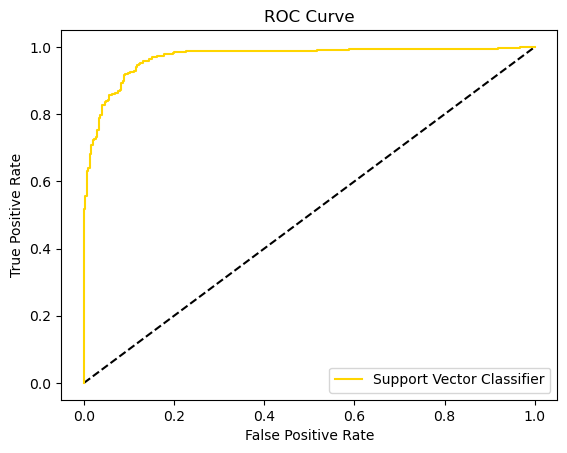

AUC Score :
 0.9687132167479402


In [196]:
from sklearn.metrics import roc_auc_score, roc_curve

final_model = SVC(probability=True)

# Fit the model (retrain if necessary)
final_model.fit(x_train, y_train)

# Now you can use predict_proba
y_pred = final_model.predict_proba(x_test)[:, 1]  # Get the probabilities for the positive class
fpr, tpr, thresholds = roc_curve(y_test, y_pred)

# Plot the ROC curve
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr, label='Support Vector Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='best')
plt.show()

# Calculate and print AUC score
auc_score = roc_auc_score(y_test, y_pred)
print('\033[1m' + 'AUC Score :' + '\033[0m\n', auc_score)


# Save the Model

In [197]:
import joblib
joblib.dump(final_model,'hr_analytics.pkl')

['hr_analytics.pkl']

In [198]:
# lets load the saved model and get the predictions
model=joblib.load("hr_analytics.pkl")

# prediction
prediction=model.predict(x_test)
prediction

array([0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1,
       1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1,
       1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0,
       0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0,
       1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1,
       1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0,
       0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1,
       1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0,
       0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0,
       1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0,
       0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0,

In [199]:
a=np.array(y_test)
df=pd.DataFrame()
df["Predicted"]=prediction
df["Original"]=a
df 

,Predicted,Original
0,0,0
1,1,1
2,0,0
3,1,1
4,1,1
...,...,...
612,0,0
613,1,1
614,1,1
615,0,0


#### Conclusion:
{'C': 2.0, 'gamma': 'auto', 'kernel': 'rbf', 'max_iter': -1, 'random_state': 1}
In this HR analytics project, we developed a predictive model to identify factors contributing to employee attrition. By analyzing features such as job satisfaction,PercentSalaryHike ,MonthlyIncome,Age,DistanceFromHome, etc. we identified key drivers of attrition. Support Vector Classifier(SVC) model was the most effective in predicting whether an employee is likely to leave the organization.

Through hyperparameter tuning, including list key hyperparameters, e.g. C,gamma,kernel,max_iter,random_state. we optimized the model's performance, achieving an accuracy of 93% accuracy. This model can serve as a valuable tool for HR departments, enabling proactive interventions to reduce turnover.